# Analisis Data Transjakarta

### 🚌 **Background**
Jakarta sebagai ibu kota Indonesia menghadapi tantangan besar seperti kemacetan, polusi udara, dan mobilitas harian yang padat. Untuk mengatasi hal ini,  <br> Pemprov DKI Jakarta mengembangkan TransJakarta—sistem Bus Rapid Transit (BRT) pertama di Asia Tenggara sejak 2004.

TransJakarta dirancang untuk menyediakan transportasi umum yang cepat, aman, nyaman, dan terjangkau, dengan jalur khusus (busway) yang bebas hambatan.  <br> Jaringan pelayanannya kini mencakup 13 koridor utama dan ratusan rute pengumpan yang menjangkau wilayah penyangga seperti Bekasi, Depok, dan Tangerang.

Dengan lebih dari 800.000 penumpang per hari, TransJakarta menjadi salah satu moda transportasi terbesar di Indonesia. Namun, tantangan tetap ada—seperti  <br> 
- ketimpangan jumlah penumpang antar rute
- waktu tunggu yang belum merata, 
- Tingginya angka penumpang yang tidak melakukan tap-out

Masalah terakhir ini berdampak pada keakuratan data perjalanan, pemborosan sumber daya, dan potensi penyalahgunaan kartu oleh lebih dari satu orang. Oleh karena itu, analisis data dibutuhkan untuk mengidentifikasi pola dan mengusulkan perbaikan sistem.


### ❗️ **Problem Statement**
<p> Bagaimana TransJakarta dapat meningkatkan efisiensi dan keadilan layanan melalui pemahaman perilaku pengguna, optimalisasi rute dan koridor, serta pencegahan pelanggaran sistem tap-out? </p>

### 🔍 Key Questions

1. Analisis Pola Tren Waktu
    - Bagaimana pola perjalanan pengguna berdasarkan jam (_hourly trend_)?
    - Apakah terdapat perbedaan pola perjalanan antara hari kerja (weekday) dan akhir pekan (_weekend_)?
    - Jam berapa yang menunjukkan aktivitas tertinggi (jam sibuk)?
    - agaimana durasi perjalanan (_trip duration_) berbeda antara hari kerja dan akhir pekan?
    - Bagaimana sebaran jumlah perjalanan berdasarkan kombinasi hari dan jam?

2. Analisis Rute dan Koridor
    - Koridor mana saja yang memiliki volume penumpang tertinggi dan terendah?
    - Apa saja rute atau koridor favorit yang sering digunakan pengguna (tap-in terbanyak)?
    - Bagaimana persebaran lokasi tap-in dan tap-out?
    - Apakah ada korelasi antara waktu sibuk dan kepadatan koridor tertentu?

3. Analisis Gagal Tap-Out
    - Pada jam berapa dan hari apa kegagalan tap-out paling sering terjadi?
    - Apakah terdapat koridor tertentu yang memiliki tingkat gagal tap-out lebih tinggi dari yang lain?
    - Bagaimana distribusi gagal tap-out berdasarkan kelompok usia pengguna?
    - Apakah pola gagal tap-out mengikuti tren waktu sibuk atau terdapat karakteristik tersendiri?

![TransJakarta](Rute-transjakarta.jpg)

## Data Exploration
Tahap ini bertujuan untuk mengetahui karakteristik data, seperti jumlah, tipe dan konteks data maupun anomali pada data seperti missing value, duplikat, outlier dll. <br>
Sehingga kita bisa menentukan langkah selanjutnya menjadi lebih terarah dan efisien.


In [2]:
# Import library for Dataframe
import pandas as pd
import numpy as np

# Import library Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap, MarkerCluster

# Tampilkan semua kolom
pd.set_option('display.max_columns', None)

In [3]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [4]:
# buat dataframe transjakarta
df = pd.read_csv("Transjakarta.csv")

In [5]:
# Menampilkan 10 data awal
df.head(5)

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,Pal Putih,-6.184631,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,Kemenkes 2,-6.228700,106.83302,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,Gg. Kunir II,-6.133132,106.81435,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,Taman Elok 1,-6.195743,106.93526,23,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,Sunter Boulevard Barat,-6.149650,106.88900,5,2023-04-03 06:17:35,P00098,Kali Besar Barat,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500.0


### 📘 Data Dictionary
Penjelasan setiap kolom dapat dibaca pada dictionary ini:

| Column Name       | Description |
|-------------------|-------------|
| **transID**        | Unique transaction ID for every transaction |
| **payCardID**      | Customer’s main identifier; the card used as a ticket for entrance and exit |
| **payCardBank**    | Customer’s card bank issuer name |
| **payCardName**    | Customer’s name embedded in the card |
| **payCardSex**     | Customer’s sex embedded in the card |
| **payCardBirthDate** | Customer’s birth year |
| **corridorID**     | Corridor/Route ID used as key for route grouping |
| **corridorName**   | Corridor/Route Name, contains start and end of the route |
| **direction**      | Route direction; 0 = Go, 1 = Back |
| **tapInStops**     | Tap In (entrance) Stop ID |
| **tapInStopsName** | Tap In (entrance) Stop Name |
| **tapInStopsLat**  | Latitude of Tap In Stop |
| **tapInStopsLon**  | Longitude of Tap In Stop |
| **stopStartSeq**   | Stop sequence at Tap In (e.g., 1st stop, 2nd stop) related to direction |
| **tapInTime**      | Time of tap in (date and time) |
| **tapOutStops**    | Tap Out (exit) Stop ID |
| **tapOutStopsName**| Tap Out (exit) Stop Name |
| **tapOutStopsLat** | Latitude of Tap Out Stop |
| **tapOutStopsLon** | Longitude of Tap Out Stop |
| **stopEndSeq**     | Stop sequence at Tap Out (e.g., 1st stop, 2nd stop) related to direction |
| **tapOutTime**     | Time of tap out (date and time) |
| **payAmount**      | Amount paid by customer; some may be zero (free rides) |


### **Konteks**
- Dataset ini merepresentasikan data perjalanan pengguna layanan Transjakarta yang melakukan satu kali perjalanan (single trip) atau dua kali perjalanan (round trip) dalam satu hari.
- Informasi mengenai pengguna yang melakukan transit antar koridor belum tercakup dalam dataset ini.
- Dataset juga belum mencakup data layanan pendukung lainnya yang mungkin memengaruhi pengalaman atau preferensi pengguna dalam menggunakan layanan Transjakarta.

## Data Explroation
Pada tahap ini kita akan mencari tau karakteristik dari dataset yang digunakan untuk analisis Data Transjakarta

In [6]:
# Menampilkan karakteristik tiap kolom dalam dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37900 entries, 0 to 37899
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   transID           37900 non-null  object 
 1   payCardID         37900 non-null  int64  
 2   payCardBank       37900 non-null  object 
 3   payCardName       37900 non-null  object 
 4   payCardSex        37900 non-null  object 
 5   payCardBirthDate  37900 non-null  int64  
 6   corridorID        36643 non-null  object 
 7   corridorName      35970 non-null  object 
 8   direction         37900 non-null  float64
 9   tapInStops        36687 non-null  object 
 10  tapInStopsName    37900 non-null  object 
 11  tapInStopsLat     37900 non-null  float64
 12  tapInStopsLon     37900 non-null  float64
 13  stopStartSeq      37900 non-null  int64  
 14  tapInTime         37900 non-null  object 
 15  tapOutStops       35611 non-null  object 
 16  tapOutStopsName   36556 non-null  object

Berdasarkan informasi diatas, terdapat **22 kolom** dengan **jumlah baris 37.900** secara keseluruhan. Kita asumsikan bahwa total baris adalah jumlah trip transjakarta untuk satu kali trip sehingga jumlah trip pada dataset ini adalah 37.900. Beberapa kolom memiliki tipe data yang tidak sesuai seperti `payCardID`, `payCardBirthDate`, `tapInTime` dan `tapOutTime`.
Kemudian terdapat beberapa kolom yang memiliki missing value seperti `corridorID`, `corridorName`, `tapInStopsName`, `tapOutStops`, dll. Sehingga kita perlu melakukan cleaning data tersebut untuk menghindari bias pada saat analisis.

In [7]:
# Deskriptif analytics pada kolom number
df.describe()

,payCardID,payCardBirthDate,direction,tapInStopsLat,tapInStopsLon,stopStartSeq,tapOutStopsLat,tapOutStopsLon,stopEndSeq,payAmount
count,3.790000e+04,37900.000000,37900.000000,37900.000000,37900.000000,37900.000000,36556.000000,36556.000000,36556.000000,36893.000000
mean,4.250060e+17,1990.089314,0.500633,-6.214838,106.841554,13.572480,-6.214651,106.841233,21.219909,2699.712683
std,1.321699e+18,13.051482,0.500006,0.057911,0.060369,12.237623,0.059022,0.060999,13.800689,4212.225592
min,6.040368e+10,1946.000000,0.000000,-6.394973,106.614730,0.000000,-6.394973,106.614730,1.000000,0.000000
25%,1.800442e+14,1982.000000,0.000000,-6.245863,106.803470,4.000000,-6.247225,106.801750,11.000000,0.000000
50%,3.507947e+15,1990.000000,1.000000,-6.214587,106.834830,10.000000,-6.214718,106.834580,18.000000,3500.000000
75%,4.699023e+15,2001.000000,1.000000,-6.175528,106.882270,19.000000,-6.174736,106.883030,29.000000,3500.000000
max,4.997694e+18,2012.000000,1.000000,-6.089429,107.023950,68.000000,-6.091746,107.023660,77.000000,20000.000000


Data deksriptif diatas menunjukan secara singkat karakteristik dari kolom number. Berdasarkan data diatas kita bisa mengetahui sebaran umur pengguna layanan Transjakarta pada kolom `payCardBirthDate`, namun data tersebut masih berupa tahun kelahiran. sehingga perlu dilakukan transformasi data untuk memudahkan saat analisis.

#### 1. Analisis data User
- Berapa user yang menggunakan layanan transjakarta pada dataset ini?
- Berapa banyak Jumlah trip peruser ID?

In [8]:
# Total user in this dataset
print(f' Total user pada dataset transjakarta adalah {df['payCardID'].nunique()}')

 Total user pada dataset transjakarta adalah 2000


Berdasarkan data di atas dari jumlah user pada dataset ini adalah 2000, diambil dari data unik kolom `payCardID`. Dari 2000 user tersebut melakukan perjalanan dengan transjakarta sebanyak 37.900 trip.

#### 2. Anlisis Metode Pembayaran

In [9]:
# Total trip perUserID
df['payCardID'].value_counts().reset_index()

,payCardID,count
0,180062659848800,40
1,2273899076950287,40
2,3533955956389840,40
3,5250092671931114,40
4,4739532514157439,40
...,...,...
1995,5598479367629402,1
1996,180046572914583,1
1997,213198923840248,1
1998,4306052879688,1


Berdasarkan data dari `payCardID` jumlah maksimal trip perUser adalah 40 dan jumlah minimal trip adalah 1.

In [10]:
# Analisis pengguna berdasarkan card payment
print(f'Jumlah data unique berdasarkan kolom payCardBank: {df['payCardBank'].nunique()}')
print(f'Data unique berdasarkan kolom payCardBank: {df['payCardBank'].unique()}')

Jumlah data unique berdasarkan kolom payCardBank: 6
Data unique berdasarkan kolom payCardBank: ['emoney' 'dki' 'flazz' 'online' 'brizzi' 'bni']


In [11]:
# Cek proporsi metode pembayaran
df['payCardBank'].value_counts(normalize=True)

payCardBank
dki       0.494538
emoney    0.181161
brizzi    0.093166
flazz     0.085330
online    0.075699
bni       0.070106
Name: proportion, dtype: float64

Berdasarkan `payCardBank` menunjukan bahwa pengguna layanan transjakarta didominasi menggunakan Bank DKI sebagai metode pembayarannya

In [12]:
# Analisis pengguna berdasarkan gender
df['payCardSex'].value_counts(normalize=True) * 100

payCardSex
F    53.184697
M    46.815303
Name: proportion, dtype: float64

Pengguna layanan Transjakarta didomnasi oleh wanita dengan presentase 53%, namun perbedaan tersebut tidak terlalu signifikan dibanding pengguna pria yaitu sekitar 47%.
Artinya layanan Transjakarta ini bisa dinikmati oleh semua gender baik wanita maupun pria.

In [13]:
# Cek jumlah koridor
df['corridorName'].nunique()

216

Berdasarkan data `corridorName` menunjukan bahwa pada dataset ini memiliki jumlah koridor sebanyak 200+ koridor yang tersebar di Jakarta dan sekitarnya.

Transjakarta memiliki beberapa layanan:
- Reguler : Layanan standar yang digunakan oleh mayoritas penumpang dengan tarif normal (Rp 3.500).
- Gratis : Layanan yang disediakan gratis bagi kelompok tertentu sebagai bagian dari kebijakan inklusif Pemerintah Provinsi DKI Jakarta. seperti Lansia, difabel, petugas layanan publik (dengan kartu khusus).
- Premium : Layanan dengan standar lebih tinggi yang ditujukan bagi pengguna dengan kebutuhan kenyamanan dan eksklusivitas lebih tinggi.

In [14]:
# Persentase pengguna berdasarkan jenis layanan
df['payAmount'].value_counts(normalize=True) * 100

payAmount
3500.0     50.153146
0.0        45.125091
20000.0     4.721763
Name: proportion, dtype: float64

Berdasarkan informasi diatas pengguna layanan Transjakarta didominasi oleh pengguna reguler sekitar 50%, selanjutnya layanan gratis 45% dan layanan premium sekitar 5%. <br>
Persentase pengguna layanan gratis yang hampir setara dengan pengguna reguler menunjukkan bahwa TransJakarta telah berhasil menjalankan fungsinya sebagai moda transportasi publik yang inklusif dan menjangkau kelompok rentan, seperti lansia dan difabel. <br>
Ini menjadi bukti bahwa TransJakarta tidak hanya berperan sebagai kendaraan umum yang efisien, tetapi juga memenuhi tanggung jawab sosialnya sebagai layanan publik yang berkeadilan akses.

### Kesimpulan

- Dataset ini mencatat lebih dari 37.000 transaksi yang dilakukan oleh sekitar 2.000 pengguna layanan TransJakarta.
- Beberapa kolom seperti `corridorID`, `corridorName`, `tapInStops`, `tapOutStops`, `tapOutStopsName`, `tapOutStopsLat`, `tapOutStopsLon`, `stopEndSeq`, `tapOutTime` dan `payAmount` memiliki missing value dan harus segera di Handle.
- Distribusi jenis kartu pada kolom `payCardBank` menunjukkan bahwa mayoritas pengguna menggunakan Kartu DKI sebagai metode pembayaran, dengan proporsi yang jauh lebih tinggi dibanding jenis kartu lainnya.
- Tidak terdapat perbedaan signifikan dalam penggunaan layanan berdasarkan gender, yang menunjukkan bahwa layanan TransJakarta cukup inklusif dan ramah bagi semua gender.
- Dataset ini mencakup lebih dari 200 koridor, mencerminkan kompleksitas dan cakupan luas dari layanan TransJakarta.
- Berdasarkan jenis layanan penumpang reguler memiliki jumlah tertinggi sekitar 50%, lalu penumpang gratis (subsidi) 45%, dan premium sebanyak 4%. 

## Data Clening <br>
Data cleaning merupakan langkah penting dalam menyiapkan data sebelum dianalisis. Tujuannya adalah untuk memastikan data bersih dan bebas dari masalah yang bisa memengaruhi hasil analisis. Dalam proses ini, kita meninjau keberadaan data yang hilang (missing values) dan nilai-nilai ekstrem (outlier), <br> lalu memutuskan apakah akan menghapus atau memperbaikinya demi meningkatkan kualitas data. Bila ditemukan data duplikat yang benar-benar identik, data tersebut biasanya akan dihapus. Selain itu, kita juga melakukan transformasi pada tipe data tertentu, seperti mengubah kolom tanggal agar lebih sesuai dan relevan untuk analisis berikutnya.

Berikut merupakan tahapan dalam data cleaning pada project ini:
1. Tranformasi bentuk kolom
1. Handle Missing data
1. Handle Duplikat data
1. Handle Outlier
1. Cek konsitensi

### 1. Tranformasi Bentuk Kolom
Pada tahap ini, kita akan mengubah format atau tipe data dari beberapa kolom agar lebih sesuai untuk keperluan analisis. Transformasi ini penting untuk memastikan data dapat diolah dengan benar dan menghasilkan insight yang akurat. <br> 
Beberapa pertanyaan panduan dalam proses ini antara lain:

- Kolom mana saja yang memiliki format atau tipe data yang tidak sesuai?
- Mengapa kolom tersebut perlu diubah?
- Apakah data tersebut dapat digunakan secara efektif dalam analisis setelah transformasi?

In [15]:
df.dtypes

transID              object
payCardID             int64
payCardBank          object
payCardName          object
payCardSex           object
payCardBirthDate      int64
corridorID           object
corridorName         object
direction           float64
tapInStops           object
tapInStopsName       object
tapInStopsLat       float64
tapInStopsLon       float64
stopStartSeq          int64
tapInTime            object
tapOutStops          object
tapOutStopsName      object
tapOutStopsLat      float64
tapOutStopsLon      float64
stopEndSeq          float64
tapOutTime           object
payAmount           float64
dtype: object

**Apa dan mengapa kolom tersebut diubah?**
Berdasarkan temuan pada tahap eksplorasi data, terdapat beberapa kolom yang memiliki tipe data tidak sesuai dengan fungsinya. Jika tidak ditangani, hal ini dapat menghambat proses analisis, terutama ketika ingin melakukan manipulasi data atau visualisasi. Misalnya, kolom tapInTime bertipe object padahal berisi data waktu. Tanpa mengubahnya ke tipe datetime, kita tidak dapat menganalisis pola waktu atau tren penggunaan layanan Transjakarta.

Adapun kolom-kolom yang perlu diubah beserta alasannya adalah sebagai berikut:

- `payCardID` <br> Kolom ini berisi ID pengguna. Meski secara default dapat terbaca sebagai numerik, sebaiknya disimpan sebagai tipe object (string). Tujuannya adalah agar tidak ikut teragregasi dalam operasi numerik dan mencegah terjadinya perubahan nilai ID yang seharusnya unik.

- `payCardBirthDate` <br> Kolom ini awalnya bertipe integer, namun karena berisi informasi tanggal lahir, maka perlu diubah ke format datetime. Dengan begitu, kita dapat mengekstrak informasi tambahan seperti tahun kelahiran, usia, atau bahkan segmentasi umur pengguna.

- `tapInTime` & `tapOutTime` <br> Kedua kolom ini menyimpan data waktu pengguna saat naik dan turun dari bus. Saat ini bertipe object, padahal analisis waktu seperti pola perjalanan, jam sibuk, atau durasi perjalanan hanya dapat dilakukan jika data tersebut dikonversi ke format datetime.



In [16]:
# Ubah kolom payCardID ke tipe data object
df['payCardID'] = df['payCardID'].astype('object')

In [17]:
df['payCardID']

0            180062659848800
1           4885331907664776
2           4996225095064169
3               639099174703
4               570928206772
                ...         
37895    4685818286724028395
37896       6502902290603767
37897        213159426675861
37898        377840859133591
37899           501862539795
Name: payCardID, Length: 37900, dtype: object

Kita berhasil mengubah tipe data dari kolom `payCardID` tanpa mengubah data didalamnya

Selanjutnya kita akan mengubah kolom `payCardBirthDate` menjadi bentuk datetime agar kita bisa menegtract informasi tanggan pada data tersebut.

In [18]:
# ubah tipe data 
df['payCardBirthDate'] = pd.to_datetime(df['payCardBirthDate'], format='%Y')

Berdasarkan data diatas, kita berhasil mengubah bentuk kolom `payCardBirthDate` menjadi datetime. Dari kolom ini kita bisa mengetahui usia dari pengguna Transjakarta, agar data tersebut bisa digunakan maka kita akan menambah 1 kolom yang berisi umur dari pengguna transjakarta. Namun kita perlu mengubah terlebih dahulu kolom `tapInTime` & `tapInTime` untuk melihat usia pada saat terakhir menggunakan layanan transjakarta.

In [19]:
# Cek hasil tranformasi
df['payCardBirthDate']

0       2008-01-01
1       1997-01-01
2       1992-01-01
3       1978-01-01
4       1982-01-01
           ...    
37895   2004-01-01
37896   1974-01-01
37897   1976-01-01
37898   1976-01-01
37899   1985-01-01
Name: payCardBirthDate, Length: 37900, dtype: datetime64[ns]

In [20]:
# ubah tipe data tapInTime dan tapOutTime dari object ke datetime
df['tapInTime'] = pd.to_datetime(df['tapInTime'])
df['tapOutTime'] = pd.to_datetime(df['tapOutTime'])

In [21]:
# Cek hasil transformasi
df['tapInTime']

0       2023-04-03 05:21:44
1       2023-04-03 05:42:44
2       2023-04-03 05:59:06
3       2023-04-03 05:44:51
4       2023-04-03 06:17:35
                ...        
37895   2023-04-21 18:18:37
37896   2023-04-18 21:52:31
37897   2023-04-04 10:29:47
37898   2023-04-15 19:59:26
37899   2023-04-12 21:08:12
Name: tapInTime, Length: 37900, dtype: datetime64[ns]

In [22]:
# Cek hasil transformasi
df['tapOutTime']

0       2023-04-03 06:00:53
1       2023-04-03 06:40:01
2       2023-04-03 06:50:55
3       2023-04-03 06:28:16
4       2023-04-03 06:57:03
                ...        
37895   2023-04-21 19:55:49
37896   2023-04-18 22:28:22
37897   2023-04-04 13:27:25
37898   2023-04-15 20:27:50
37899   2023-04-12 21:34:53
Name: tapOutTime, Length: 37900, dtype: datetime64[ns]

Kita berhasil mengubah tipe data `tapInTime` and `tapOutTime` tanpa mengubah isi didalamnya.

✨**Insight**
- Berdasarkan hasil eksplorasi, seluruh perjalanan yang tercatat dalam dataset ini terjadi pada bulan **April 2023**.
- Perlu dicatat bahwa sebagian besar periode tersebut bertepatan dengan bulan Ramadhan, sehingga terdapat kemungkinan perbedaan pola perilaku pengguna dibandingkan dengan bulan-bulan lainnya. Hal ini bisa memengaruhi waktu perjalanan, volume pengguna, serta intensitas penggunaan layanan pada jam-jam tertentu.

In [23]:
# Mebuat kolom usia diambil dari kolom tapInTime dikurangi payCardBirthDate 
df['usia'] = ((df['tapInTime'] - df['payCardBirthDate']).dt.days / 365.25).astype('int')

In [24]:
df['usia'].head()

0    15
1    26
2    31
3    45
4    41
Name: usia, dtype: int64

Berdasarkan data diatas kita berhasil membuat kolom `usia` dengan mengambil data dari `payCardBirthDate` dan `tapInTime`.

Kita juga bisa melakukan Penambahan kolom **Trip Duration** dengan mengambil data dari `tapInTime` dan `tapOutTime`. Kolom ini digunakan agar kita bisa mengavaluasi rata-rata trip pengguna transjakarta berdasarkan waktu seperti jam padat ataupun perbedaan pada hari kerja maupun hari libur.

In [25]:
# Buat kolom trip duration
df['TripDurationInMinutes'] = df['tapOutTime'] - df['tapInTime']
df['TripDurationInMinutes'] = (df['TripDurationInMinutes'].dt.total_seconds() / 60).round(0)

In [26]:
df['TripDurationInMinutes']

0         39.0
1         57.0
2         52.0
3         43.0
4         39.0
         ...  
37895     97.0
37896     36.0
37897    178.0
37898     28.0
37899     27.0
Name: TripDurationInMinutes, Length: 37900, dtype: float64

Kita berhasil membuat kolom `TripDurationInMinutes`, trip duration tersebut dibuat dalam menit agar kita bisa lebih menangkap variasi yang terjadi.

Ambil data Jam, hari dan bulan pada kolom `tapInTime` untuk digunakan dalam analisis trend berdasarkan waktu.

In [27]:
# Jam (angka 0-23)
df['tapInHour'] = df['tapInTime'].dt.hour

# Ambil nama hari (Monday, Tuesday, ...)
df['tapInDay'] = df['tapInTime'].dt.day_name()

# Ambil tanggal (1–31)
df['tapInDate'] = df['tapInTime'].dt.day

- Berhasil mengubah data type kolom `payCardID` dan kolom `payCardBirthDate`, `tapInTime`, `tapInTime` kedalam bentuk datetime.
- Setelah itu, kita dapat mengekstrak informasi lain seperti `usia`, `TripDurationInMinutes`, `tapInHour`, `tapInDay` dan `tapInDate` yang dapat membantu dalam analisis nantinya.

### 2. Handle Missing Data
Pada tahap ini, kita akan menangani nilai-nilai yang hilang (missing values) dalam dataset. Keberadaan data yang hilang dapat berdampak pada akurasi hasil analisis dan berpotensi menimbulkan kesalahan saat proses pengolahan data. Selain itu, pola dari nilai yang hilang juga dapat mengungkap adanya anomali atau kendala dalam proses pencatatan data, yang justru bisa menjadi insight penting untuk evaluasi dan pengembangan layanan Transjakarta ke depannya.

Berikut pertantaan sebagai panduan dalam proses ini yaitu:
- Mana saja kolom yang memiliki missing value?
- Berapa jumlah missing value perkolom?
- Bagimana cara kita menghandle missing value?
- Apakah metode tersebut sudah tepat untuk menghandle missing Value?


In [28]:
# Cek missing Value untuk semua kolom
missing_value_percentage = df.isna().sum() / len(df) * 100

missing_summary = pd.DataFrame({
                                'Missing_count': df.isna().sum(),
                                'Missing_Percentage': missing_value_percentage.round(2)
})

In [29]:
# Show dataset
missing_summary.sort_values('Missing_Percentage', ascending=False)

,Missing_count,Missing_Percentage
tapOutStops,2289,6.04
corridorName,1930,5.09
TripDurationInMinutes,1344,3.55
tapOutTime,1344,3.55
stopEndSeq,1344,3.55
tapOutStopsLon,1344,3.55
tapOutStopsLat,1344,3.55
tapOutStopsName,1344,3.55
corridorID,1257,3.32
tapInStops,1213,3.20


Berdasarkan data diatas, hampir 50% kolom memliki missing value. Jumlah missing value tiap kolomnya berkisar antara 2.6% - 6%. Jumlah tersebut masih dalam kategori wajar sehingga kita tidak perlu menghapus kolom yang memiliki missing value.
- Kolom `tapOutStops` dan `corridorName` punya jumlah missing value paling tinggi di dataset, masing-masing 6,04% dan 5,09%.
- Hilangnya data tapOutStops kemungkinan besar karena pengguna tidak melakukan tap out atau sistem gagal mencatat. Ini juga sejalan dengan kolom-kolom lain yang berkaitan dengan tap out yang ikut kosong.
- kolom `tapOutTime`, `stopEndSeq`, `tapOutStopsLon`, `tapOutStopsLat`, dan `tapOutStopsLat` memiliki nilai missing value yang sama. <br>
Kelima kolom tersebut memiliki kesamaan fungsi, yaitu merekam informasi saat pengguna melakukan tap out di lokasi tujuan. Oleh karena itu, hilangnya data di kelima kolom tersebut mengindikasikan bahwa proses tap out tidak dilakukan, atau terjadi kesalahan sistem dalam mencatat tap out.  Situasi ini kemungkinan besar disebabkan oleh perilaku pengguna yang lupa melakukan tap out saat turun dari bus, atau kendala teknis seperti alat tap out yang tidak berfungsi. Nilai-nilai yang hilang ini bersifat informatif karena bisa memberikan insight terkait kepatuhan pengguna terhadap prosedur tap out, serta kinerja sistem pencatatan di halte tujuan.
- Sementara itu,`corridorName` hilang bisa jadi karena `corridorID` juga kosong, atau karena memang tidak ada tap out, jadi sistem nggak bisa mendeteksi koridornya.

#### **Apakah missing value tersebut harus dihapus?** <br>
Tidak selalu. Menghapus data secara langsung justru dapat menyebabkan hilangnya informasi penting dan menimbulkan bias dalam analisis. Oleh karena itu, langkah terbaik adalah mencoba mengisi nilai yang hilang (imputasi) dengan pendekatan yang tepat.

Maka dari itu berikut merupakan tahapan untuk menghandle missing value, sebelum kita yakin untuk menghapus data tersebut:
- Periksa apakah nilai yang hilang bisa diisi dengan merujuk pada kolom lain (menggunakan relasi antar kolom).
- Lihat distribusi data: apakah nilai yang hilang tergolong acak (missing at random) atau memiliki pola tertentu.
- Cek apakah kolom tersebut memiliki nilai dominan (modus) yang bisa digunakan sebagai isian (Jika kolom dengan tipe data non number).
- Gunakan nilai statistik sederhana (seperti mean atau median) jika konteksnya cocok dan tidak merusak distribusi data.
- Untuk data kategorikal, pertimbangkan pengisian dengan modus atau membuat kategori khusus seperti 'Unknown'.
- cek Apakah missing value tersebut akan digunakan pada tahap analisis.
- Evaluasi dampak dari imputasi tersebut terhadap analisis lanjutan.
- Jika setelah semua pertimbangan data tetap tidak bisa diisi dengan cara yang valid, maka barulah pertimbangkan untuk menghapusnya.



#### **Handle missing Value pada kolom `corridorID` dan `corridorName`**

In [30]:
# cek data dari baris yang memiliki missing value pada kolom corridorID
df.query('corridorID.isna()').head()

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
7,XTKE052E5E87LN,3587341902618993,dki,Darmanto Rajasa,F,1991-01-01,NaN,NaN,1.0,B03416P,SDN Pondok Labu 11,-6.313269,106.80221,2,2023-04-03 06:44:24,B00899P,Jln. Baros,-6.311046,106.78400,12.0,2023-04-03 07:11:43,0.0,32,27.0,6,Monday,3
120,MCWO805A6Q66MX,3570416613897992,dki,"Gawati Damanik, S.E.",F,2010-01-01,NaN,NaN,0.0,P00109,Matraman Baru,-6.212880,106.86115,8,2023-04-03 06:38:44,P00224,Slamet Riyadi,-6.208533,106.85929,9.0,2023-04-03 07:32:11,3500.0,13,53.0,6,Monday,3
240,PTDK452M9A71XF,342370004909630,emoney,"Kartika Habibi, S.Psi",M,1975-01-01,NaN,NaN,0.0,B04505P,Sbr. Standard Chartered,-6.217407,106.81934,13,2023-04-03 05:13:16,B03396P,Kota Kasablanka,-6.224688,106.84246,20.0,2023-04-03 05:39:55,3500.0,48,27.0,5,Monday,3
250,OLZA217B5B95DK,4371940047525876160,brizzi,Zelda Laksita,M,2009-01-01,NaN,NaN,1.0,B04576P,Sbr. Univ. Mercu Buana,-6.210273,106.73786,11,2023-04-03 06:24:37,B05009P,Simpang Meruya Ilir 1,-6.196682,106.75517,28.0,2023-04-03 07:13:18,0.0,14,49.0,6,Monday,3
257,GHEY769K9T55WF,4281653494791,online,Zelda Wibowo,M,1989-01-01,NaN,NaN,0.0,B00048P,Aneka PIK Penggilingan,-6.202636,106.92867,16,2023-04-03 05:05:24,B05823P,United Tractors 1,-6.183260,106.93243,28.0,2023-04-03 05:41:12,3500.0,34,36.0,5,Monday,3


In [31]:
# cek data dari baris yang memiliki missing value pada kolom corridorName
df.query('corridorName.isna()').head()

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
7,XTKE052E5E87LN,3587341902618993,dki,Darmanto Rajasa,F,1991-01-01,NaN,NaN,1.0,B03416P,SDN Pondok Labu 11,-6.313269,106.80221,2,2023-04-03 06:44:24,B00899P,Jln. Baros,-6.311046,106.78400,12.0,2023-04-03 07:11:43,0.0,32,27.0,6,Monday,3
38,RLLZ887W3V14WZ,4947438345710982,dki,Rahayu Rahayu,F,2006-01-01,5M,NaN,1.0,B02994P,PTUN Jakarta,-6.196388,106.84025,16,2023-04-03 05:29:43,B05707P,Term. Kampung Melayu 2,-6.224516,106.86685,30.0,2023-04-03 05:58:35,3500.0,17,29.0,5,Monday,3
39,JJEK861K6E37KF,3539535695881465,dki,"Dr. Zulfa Tamba, S.E.I",M,1986-01-01,2,NaN,0.0,P00202,Rawa Selatan,-6.173925,106.85809,9,2023-04-03 05:28:22,P00137,Monas,-6.176248,106.82286,19.0,2023-04-03 06:02:36,3500.0,37,34.0,5,Monday,3
60,RHUT145C1U25ZY,4290559479079,online,Lutfan Hakim,M,2011-01-01,T21,NaN,1.0,B00589P,GBK Pintu 7,-6.222095,106.80861,3,2023-04-03 05:43:48,B02556P,Palem Semi 1,-6.218812,106.61807,14.0,2023-04-03 06:09:12,20000.0,12,25.0,5,Monday,3
61,TWAK265Z0M88QR,213155263532652,emoney,Restu Waluyo,F,1984-01-01,12A,NaN,0.0,B05324P,SMKN 56,-6.119094,106.79423,9,2023-04-03 06:13:03,P00138,Museum Fatahillah,-6.133930,106.81209,18.0,2023-04-03 06:50:23,3500.0,39,37.0,6,Monday,3


In [32]:
# validasi kolom tapInStops bisa digunakan sebagai referensi
df.query('tapInStops == "B05433P"').head()

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
10,CLWK627W2M22WO,5541851157087967,dki,"Oskar Widiastuti, S.Farm",F,1997-01-01,5M,Kampung Melayu - Tanah Abang via Cikini,1.0,B05433P,Pegangsaan Timur,-6.199263,106.84205,17,2023-04-03 06:32:28,B02387P,Matraman 4,-6.199782,106.8545,23.0,2023-04-03 07:23:54,3500.0,26,51.0,6,Monday,3
610,XGVR451R4G08XY,5541851157087967,dki,"Oskar Widiastuti, S.Farm",F,1997-01-01,5M,Kampung Melayu - Tanah Abang via Cikini,1.0,B05433P,Pegangsaan Timur,-6.199263,106.84205,17,2023-04-04 05:03:41,B02387P,Matraman 4,-6.199782,106.8545,23.0,2023-04-04 05:43:31,3500.0,26,40.0,5,Tuesday,4
1210,VNRX079H7E17KM,5541851157087967,dki,"Oskar Widiastuti, S.Farm",F,1997-01-01,NaN,NaN,1.0,B05433P,Pegangsaan Timur,-6.199263,106.84205,17,2023-04-05 05:13:00,B02387P,Matraman 4,-6.199782,106.8545,23.0,2023-04-05 05:45:51,3500.0,26,33.0,5,Wednesday,5
1810,LTDU998U3N38PW,5541851157087967,dki,"Oskar Widiastuti, S.Farm",F,1997-01-01,5M,Kampung Melayu - Tanah Abang via Cikini,1.0,B05433P,Pegangsaan Timur,-6.199263,106.84205,17,2023-04-06 05:10:40,B02387P,Matraman 4,-6.199782,106.8545,23.0,2023-04-06 05:42:46,3500.0,26,32.0,5,Thursday,6
2410,XOSH837D3O96UA,5541851157087967,dki,"Oskar Widiastuti, S.Farm",F,1997-01-01,5M,Kampung Melayu - Tanah Abang via Cikini,1.0,B05433P,Pegangsaan Timur,-6.199263,106.84205,17,2023-04-07 05:40:54,B02387P,Matraman 4,-6.199782,106.8545,23.0,2023-04-07 06:03:13,3500.0,26,22.0,5,Friday,7


In [33]:
# validasi kolom tapInStops bisa digunakan sebagai referensi
df.query('tapInStopsName == "Pegangsaan Timur"').head()

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
10,CLWK627W2M22WO,5541851157087967,dki,"Oskar Widiastuti, S.Farm",F,1997-01-01,5M,Kampung Melayu - Tanah Abang via Cikini,1.0,B05433P,Pegangsaan Timur,-6.199263,106.84205,17,2023-04-03 06:32:28,B02387P,Matraman 4,-6.199782,106.8545,23.0,2023-04-03 07:23:54,3500.0,26,51.0,6,Monday,3
610,XGVR451R4G08XY,5541851157087967,dki,"Oskar Widiastuti, S.Farm",F,1997-01-01,5M,Kampung Melayu - Tanah Abang via Cikini,1.0,B05433P,Pegangsaan Timur,-6.199263,106.84205,17,2023-04-04 05:03:41,B02387P,Matraman 4,-6.199782,106.8545,23.0,2023-04-04 05:43:31,3500.0,26,40.0,5,Tuesday,4
1210,VNRX079H7E17KM,5541851157087967,dki,"Oskar Widiastuti, S.Farm",F,1997-01-01,NaN,NaN,1.0,B05433P,Pegangsaan Timur,-6.199263,106.84205,17,2023-04-05 05:13:00,B02387P,Matraman 4,-6.199782,106.8545,23.0,2023-04-05 05:45:51,3500.0,26,33.0,5,Wednesday,5
1810,LTDU998U3N38PW,5541851157087967,dki,"Oskar Widiastuti, S.Farm",F,1997-01-01,5M,Kampung Melayu - Tanah Abang via Cikini,1.0,B05433P,Pegangsaan Timur,-6.199263,106.84205,17,2023-04-06 05:10:40,B02387P,Matraman 4,-6.199782,106.8545,23.0,2023-04-06 05:42:46,3500.0,26,32.0,5,Thursday,6
2410,XOSH837D3O96UA,5541851157087967,dki,"Oskar Widiastuti, S.Farm",F,1997-01-01,5M,Kampung Melayu - Tanah Abang via Cikini,1.0,B05433P,Pegangsaan Timur,-6.199263,106.84205,17,2023-04-07 05:40:54,B02387P,Matraman 4,-6.199782,106.8545,23.0,2023-04-07 06:03:13,3500.0,26,22.0,5,Friday,7


Berdasarkan hasil eksplorasi, ditemukan bahwa kolom `corridorID` dan `corridorName` memiliki nilai yang hilang (missing value). Kedua kolom ini bisa kita isi berdasarkan referensi kolom lain. 

Disini kita menggunakan pendekatan dengan referensi dari kolom `tapInStops` dan `tapOutStops`. 

Kenapa menggunakan kolom tersebut sebagai referensi?
kolom tersebut bersifat unik dan juga memiliki hierarki yang jelas dengan kolom `corridorID` dan `corridorName`. 1 `tapInStops` hanya memiliki `corridorID` dan `corridorName`, sehingga secara logika dapat digunakan sebagai referensi. Namun jika kolom `tapInStops` kosong maka akan menggunakan kolom `tapOutStops` sebagai referensi.

Berikut strategi imputasi yang dapat dilakukan:

- Jika `corridorName` atau `corridorID` kosong, maka kolom tersebut dapat diisi dengan nilai dari `tapInStops`.
- Jika `tapInStops` kosong, maka digunakan `tapOutStops` sebagai referensi
- Jika Data tersebut unik artinya hanya memiliki `tapInStops` dan `tapOutStops` berjumlah satu sehingga tidak bisa mereferensikan dengan baris lain. Data tersebut bisa kita hapus.

Pendekatan ini memungkinkan kita untuk tetap mempertahankan data sebanyak mungkin tanpa mengorbankan akurasi analisis.

In [34]:
# 1. Pastikan semua kolom kunci bersih dan tipenya konsisten (opsional tapi sangat disarankan)
# Ganti 'tapInStops', 'tapOutStops' dengan nama kolom ID halte Anda yang sebenarnya jika berbeda
df['tapInStops'] = df['tapInStops'].astype(str).str.strip()
df['tapOutStops'] = df['tapOutStops'].astype(str).str.strip()


# 2. Buat Kamus Induk (Master Map) dari DUA sumber
# Ambil semua baris yang data koridornya lengkap sebagai sumber referensi
source_df = df.dropna(subset=['corridorID', 'corridorName']).copy()

# Buat mapping dari tapInStops
map_in = source_df[['tapInStops', 'corridorID', 'corridorName']].rename(columns={'tapInStops': 'stop_id'})

# Buat mapping dari tapOutStops
map_out = source_df[['tapOutStops', 'corridorID', 'corridorName']].rename(columns={'tapOutStops': 'stop_id'})

# Gabungkan kedua mapping menjadi satu, buang data duplikat, dan jadikan kamus
master_map_df = pd.concat([map_in, map_out]) \
                  .drop_duplicates(subset='stop_id') \
                  .set_index('stop_id')


# 3. Isi missing values dalam DUA TAHAP menggunakan kamus induk
# Tahap 1: Coba isi berdasarkan tapInStops
df['corridorID'] = df['corridorID'].fillna(df['tapInStops'].map(master_map_df['corridorID']))
df['corridorName'] = df['corridorName'].fillna(df['tapInStops'].map(master_map_df['corridorName']))

# Tahap 2: Untuk sisa yang masih kosong, coba isi berdasarkan tapOutStops
df['corridorID'] = df['corridorID'].fillna(df['tapOutStops'].map(master_map_df['corridorID']))
df['corridorName'] = df['corridorName'].fillna(df['tapOutStops'].map(master_map_df['corridorName']))


# 4. Cek hasil akhir
print("Sisa missing value setelah menggunakan dua referensi:")
print(df[['corridorID', 'corridorName']].isna().sum())

Sisa missing value setelah menggunakan dua referensi:
corridorID       8
corridorName    11
dtype: int64


Setelah melakukan pengisian missing Value dengan referensi kolom lain. Hasilnya adalah jumlah missing value berkurang dari **1.257 menjadi 8** pada kolom `corridorID` dan **1.930 menjadi 11** pada kolom `corridorName`.

In [35]:
# Validasi sisa missing value
df.query('corridorID.isna()').head(5)

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
32635,RTIV356D2T97KG,180095534848678,emoney,Paris Lazuardi,M,2007-01-01,NaN,NaN,0.0,B01702P,Jln. Warakas I Gg. 5B,-6.116724,106.878010,39,2023-04-09 15:20:04,B06889P,Jln. Tenggiri Tj. Priok,-6.114067,106.879436,44.0,2023-04-09 16:58:56,0.0,16,99.0,15,Sunday,9
33291,QFYQ646L4W85VF,579559716439,flazz,Indah Zulaika,M,2001-01-01,NaN,NaN,0.0,B06169P,Jln. Danau Sunter Barat 1,-6.130709,106.855240,8,2023-04-15 16:09:14,B02499P,Museum Bank Indonesia,-6.137242,106.813320,35.0,2023-04-15 16:46:45,0.0,22,38.0,16,Saturday,15
33377,CVQB088M7R35ZB,180090240275308,emoney,Luis Hidayanto,F,2008-01-01,NaN,NaN,0.0,B00298P,Dapsus 4,-6.301649,106.794720,17,2023-04-15 06:07:40,B02482P,MTsN 19,-6.304793,106.801700,25.0,2023-04-15 07:18:19,0.0,15,71.0,6,Saturday,15
33441,LFRB327P3Y78OA,4518705930955431,dki,Wirda Oktaviani,F,1993-01-01,NaN,NaN,1.0,B03057P,Puskesmas Kota Bambu Selatan,-6.186436,106.807370,20,2023-04-22 16:36:15,B01446P,Jln. Pam Lama I,-6.203921,106.805380,32.0,2023-04-22 17:46:30,0.0,30,70.0,16,Saturday,22
33644,XXLW395H7A85LJ,2267480345217374,dki,Suci Hutagalung,M,1966-01-01,NaN,NaN,1.0,B06453P,Jln. Pulo Gundul 2,-6.183229,106.851486,27,2023-04-22 14:25:23,B06456P,Jln. Tanah Tinggi IV,-6.178099,106.847887,30.0,2023-04-22 14:58:30,0.0,57,33.0,14,Saturday,22


In [36]:
# Validasi sisa missing value
df.query('corridorID.isna()')
df.query('tapOutStops == "B06889P"')

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
32635,RTIV356D2T97KG,180095534848678,emoney,Paris Lazuardi,M,2007-01-01,NaN,NaN,0.0,B01702P,Jln. Warakas I Gg. 5B,-6.116724,106.87801,39,2023-04-09 15:20:04,B06889P,Jln. Tenggiri Tj. Priok,-6.114067,106.879436,44.0,2023-04-09 16:58:56,0.0,16,99.0,15,Sunday,9


Berdasarkan data diatas, kenapa sisa missing value pada data ini tetap ada, karena data diatas bersifat unik dan memiliki nilai missing value pada `corridorID` dan `corridorName` sehingga kita tidak bisa melakukan referensi dengan baris lain. Sehingga kita bisa menghapus data tersebut.

Menghapus data tersebut tidak akan menyebabkan bias pada saat analisis karena jumlah data yang dihapus hanya 0.1% dari keseluruhan

#### Handle missing Value pada kolom `tapInStop`

In [37]:
# Cek missing value pada
df.query('tapInStops.isna()').head(5)

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate


Berdasarkan data diatas menunjukan bahwa pada kolom `tapInStops` memiliki missing value sehingga harus kita handle. Data diatas juga menunjukan bahwa kolom `tapInStops` yang missing memiliki `corridorName` dan `corridorID`. 

Apakah kolom tersebut bisa dijadikan referensi?
Jawabannya tidak karena `corridorName` dan `corridorID` memiliki banyak `tapInStops` sehingga jika kita menggunakan sebagai referensi akan menjadi bias dan kesalahan pada data. Sehingga kita bisa menggunakan kolom `tapInStopsName` sebagai referensi dengan asumsi bahwa nama tidak terdapat variasi nilai ataupun typo.

Missing value pada kolom `tapInStops` dapat kita referensikan dengan kolom lain seperti cara sebelumnya. Disini kita bisa mereferensikan dengan kolom `corridorID` atau `corridorName`

In [38]:
# Memastikan nilai value dalam bentuk null bukan nan sebagai string
df['tapInStops'] = df['tapInStops'].replace('nan', np.nan)

# Pastikan kolom kunci (tapInStopsName) bersih
df['tapInStopsName'] = df['tapInStopsName'].astype(str).str.strip().str.lower()

# Buat kamus pemetaan dari nama ke ID halte
source_df = df.dropna(subset=['tapInStops']).copy()
source_df['tapInStopsName'] = source_df['tapInStopsName'].astype(str).str.strip().str.lower()
stops_map = source_df.drop_duplicates(subset='tapInStopsName') \
                     .set_index('tapInStopsName')['tapInStops']

# Isi nilai NaN di kolom 'tapInStops'
df['tapInStops'] = df['tapInStops'].fillna(df['tapInStopsName'].map(stops_map))


# 3. Cek hasil akhir, seharusnya jumlah NaN sudah berkurang drastis
print("Sisa missing value di kolom tapInStops setelah perbaikan:")
print(df['tapInStops'].isna().sum())

Sisa missing value di kolom tapInStops setelah perbaikan:
34


Setelah melakukan referensi dengan kolom `tapInStopsName` menyisakan missing value sebanyak 34. Nilai tersebut bisa kita hapus karena tidak akan mempengaruhi hasil analisis secara keseluruhan karena jumlahnya terbilagn sangat sedikit.

In [39]:
# Cek hasil setelah dilakukan imputasi
df.query('tapInStops.isna()').head(5)

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
32155,YWRK695S6M25WV,346031371330778,emoney,Putri Wibowo,F,1982-01-01,7P,Pondok Kelapa - BKN,0.0,NaN,ppkd jaktim,-6.247777,106.94236,6,2023-04-08 18:01:36,nan,NaN,NaN,NaN,NaN,NaT,3500.0,41,NaN,18,Saturday,8
32262,MAVS929E2U67DY,5530470482508325,dki,Jamalia Lestari,F,2003-01-01,11C,Rusun Pinus Elok - Rusun Pulo Gebang,1.0,NaN,rusun pulo gebang,-6.201478,106.94975,0,2023-04-09 08:35:23,nan,NaN,NaN,NaN,NaN,NaT,0.0,20,NaN,8,Sunday,9
32365,GFXI432F3W42KE,342872650777880,emoney,Carla Maryati,F,2006-01-01,S11,BSD - Jelambar,0.0,NaN,bundaran alam sutera 1,-6.244107,106.64889,16,2023-04-09 19:53:59,B02990P,Pratama Abadi,-6.233124,106.64256,19.0,2023-04-09 20:17:31,3500.0,17,24.0,19,Sunday,9
32533,SJEG609E5A77VR,3511593949794788,dki,Humaira Maryadi,F,1992-01-01,12B,Pluit - Senen,1.0,NaN,graha sindu bpk penabur,-6.159971,106.83509,8,2023-04-09 18:46:36,B00122P,Baywalk 2,-6.110359,106.77961,41.0,2023-04-09 19:36:31,3500.0,31,50.0,18,Sunday,9
32572,OHMY262Z9S32VK,3531560183774236,dki,Kiandra Nashiruddin,M,1993-01-01,JAK.58,Cilincing - Rorotan,1.0,NaN,rusun rorotan 2,-6.149932,106.95478,0,2023-04-08 06:45:49,B05328P,SMKN Jasalena Marunda,-6.127384,106.95669,24.0,2023-04-08 07:10:38,0.0,30,25.0,6,Saturday,8


In [40]:
# Validasi sisa missing value
df.query('tapInStopsName == "rusun pulo gebang"')

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
32262,MAVS929E2U67DY,5530470482508325,dki,Jamalia Lestari,F,2003-01-01,11C,Rusun Pinus Elok - Rusun Pulo Gebang,1.0,NaN,rusun pulo gebang,-6.201478,106.94975,0,2023-04-09 08:35:23,nan,NaN,NaN,NaN,NaN,NaT,0.0,20,NaN,8,Sunday,9


Sama seperti pada kolom `corridorID` dan `corridorName` sisa dari missing value di kolom `tapInStops` diakarenakan data tersebut unik sehingga kita tidak bisa melakukan referensi. Disini kita akan menghapus data tersebut.

In [41]:
# Hapus kolom corridorID, corridorName dan tapInStops yang memiliki missing value
df.dropna(subset=['tapInStops', 'corridorID', 'corridorName'], inplace=True)

#### Handle missing Value pada kolom `payAmount`

In [42]:
df.query('payAmount.isna()')

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
11,IIEK980X1O23NZ,347204308990092,emoney,R.M. Labuh Laksmiwati,F,1984-01-01,M7B,BKN - Blok M,1.0,P00254,tendean,-6.240213,106.83102,12,2023-04-03 06:22:10,P00129,Mampang Prapatan,-6.242699,106.82572,14.0,2023-04-03 06:50:21,NaN,39,28.0,6,Monday,3
76,VHUC320U1S58CB,567286069354,flazz,"Dt. Atmaja Suartini, M.Farm",F,2000-01-01,JAK.48B,Stasiun Tebet - Kampung Melayu,0.0,B02272P,masjid as sudairi,-6.220626,106.85910,1,2023-04-03 06:12:01,B01732P,Jatinegara Timur,-6.220486,106.86825,11.0,2023-04-03 06:57:35,NaN,23,46.0,6,Monday,3
97,KFYK655N1H73XS,6590854673757012,dki,Bajragin Najmudin,M,1986-01-01,3H,Jelambar - Kota,0.0,P00087,jelambar,-6.166548,106.78651,0,2023-04-03 06:03:19,P00138,Museum Fatahillah,-6.133930,106.81209,9.0,2023-04-03 06:35:04,NaN,37,32.0,6,Monday,3
169,IWEH403G6J82OS,30428250357040,bni,Estiawan Hastuti,M,2008-01-01,M7B,BKN - Blok M,1.0,B02114P,lapangan blok s,-6.237011,106.81421,6,2023-04-03 05:20:08,B00290P,Dammara,-6.254190,106.83146,18.0,2023-04-03 06:08:02,NaN,15,48.0,5,Monday,3
198,WFVC738E7S60SH,3540286623681182,dki,"Karimah Pangestu, S.Kom",M,1968-01-01,JAK.48A,Stasiun Tebet - Rusun Karet Tengsin,1.0,B05695P,telkom tebet,-6.224064,106.85160,21,2023-04-03 05:24:09,B02320P,Masjid Jami Al Mamur Bukit Duri,-6.225059,106.85606,23.0,2023-04-03 05:54:13,NaN,55,30.0,5,Monday,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37661,PPYR040S6J76TM,4706129919148789,dki,Dt. Galuh Suryono,F,1987-01-01,M7B,BKN - Blok M,0.0,B03195P,rsia duren tiga 1,-6.253592,106.84130,10,2023-04-16 13:52:59,B02877P,PLN Duren Tiga 1,-6.254389,106.83416,13.0,2023-04-16 16:38:08,NaN,36,165.0,13,Sunday,16
37674,JXJU834Q7X41YL,4558670606659888636,brizzi,Tantri Siregar,M,1996-01-01,JAK.48A,Stasiun Tebet - Rusun Karet Tengsin,1.0,B03305P,sahid sudirman center,-6.211191,106.81794,10,2023-04-21 14:08:16,B03318P,Sawo Kecik Raya,-6.224852,106.85489,22.0,2023-04-21 16:56:14,NaN,27,168.0,14,Friday,21
37741,DEMB799H8M93RH,572311836488,flazz,Cornelia Haryanti,F,1989-01-01,3H,Jelambar - Kota,0.0,P00072,glodok,-6.144500,106.81545,7,2023-04-07 13:19:18,P00013,Kota,-6.136790,106.81490,10.0,2023-04-07 14:05:43,NaN,34,46.0,13,Friday,7
37861,EDZA126J0W55DK,3520040370814007,dki,Farah Latupono,M,2010-01-01,M1H,Tanah Abang - St. Gondangdia,0.0,B01232P,jln. kb. kacang viii,-6.187181,106.81827,8,2023-04-30 15:52:34,B02972P,Pospol Jati Bunder,-6.189707,106.81317,15.0,2023-04-30 18:38:25,NaN,13,166.0,15,Sunday,30


Kolom `payAmount` punya missing value, tapi dari data yang ada, kita nggak punya informasi lain yang bisa dipakai buat referensi imputasinya. Jadi, salah satu cara yang bisa kita pakai adalah ngisi nilai kosongnya dengan modus atau nilai yang paling sering muncul.

Kenapa pakai cara ini? Karena payAmount ini bukan nilai numerik murni, tapi lebih ke kategori harga. Misalnya:

- 3.500 itu buat tarif reguler
- 2 0.000 buat layanan premium

Jadi mengisi dengan modus itu masuk akal karena kemungkinan besar itu juga tarif yang umum dipakai pengguna, dan tidak membuat data menjadi bias.

In [43]:
modus_pay = df['payAmount'].mode()[0]  # ambil nilai paling sering muncul
df['payAmount'] = df['payAmount'].fillna(modus_pay)

In [44]:
df['payAmount'].isna().sum()

np.int64(0)

- Missing value berhasil ditangani dengan cara mengisinya menggunakan nilai yang paling sering muncul (modus), yaitu 3.500.
- dari 1.007 missing value pada kolom `payAmount` menjadi 0

#### Handle missing Value pada kolom yang berkaitan dengan tapOut

In [45]:
# ubah dari string ke NaN
df['tapOutStops'] = df['tapOutStops'].replace('nan', np.nan)

Nilai `nan` sebelumnya masih berupa string, sehingga belum dikenali sebagai nilai yang hilang oleh pandas. Oleh karena itu, kita ubah kembali ke format NaN agar bisa diproses dengan benar saat melakukan analisis missing value.

In [46]:
df.isna().sum()[['tapOutStops', 'tapOutStopsName', 'tapOutStopsLat', 'tapOutStopsLon', 'stopEndSeq', 'tapOutTime']]

tapOutStops        2286
tapOutStopsName    1342
tapOutStopsLat     1342
tapOutStopsLon     1342
stopEndSeq         1342
tapOutTime         1342
dtype: int64

Berdasarkan data yang tersedia, terdapat dua kemungkinan penyebab kolom 1tapOutStops1 memiliki nilai kosong (missing value).

- Asumsi pertama, kekosongan tersebut disebabkan oleh kesalahan saat proses input, sehingga nilai yang hilang masih bisa kita isi dengan merujuk ke kolom lain yang saling terkait.

- Asumsi kedua, jumlah nilai yang hilang pada kolom `tapOutStops` serta kolom lain yang berkaitan (seperti tapOutStopsName) ternyata sama, yaitu sebanyak 1.342 baris. Hal ini mengindikasikan bahwa kemungkinan besar pengguna tidak melakukan proses tap out. Untuk kasus ini, kita biarkan nilainya tetap NaN, karena informasi tersebut bisa memberikan insight lebih lanjut saat analisis perilaku pengguna.

Dengan demikian, kita hanya akan mengisi nilai yang hilang pada `kolom tapOutStops` jika kolom lain yang relevan seperti `tapOutStopsName` memiliki data yang lengkap.

In [47]:

# . SEKARANG JALANKAN KEMBALI KODE SEBELUMNYA, PASTI BEKERJA
# Pastikan kolom kunci (tapInStopsName) bersih
df['tapOutStopsName'] = df['tapOutStopsName'].astype(str).str.strip().str.lower()

# Buat kamus pemetaan dari nama ke ID halte
source_df = df.dropna(subset=['tapOutStops']).copy()
source_df['tapOutStopsName'] = source_df['tapOutStopsName'].astype(str).str.strip().str.lower()
stops_map = source_df.drop_duplicates(subset='tapOutStopsName') \
                     .set_index('tapOutStopsName')['tapOutStops']

# Isi nilai NaN di kolom 'tapInStops'
df['tapOutStops'] = df['tapOutStops'].fillna(df['tapOutStopsName'].map(stops_map))


# 3. Cek hasil akhir, seharusnya jumlah NaN sudah berkurang drastis
print("Sisa missing value di kolom tapInStops setelah perbaikan:")
print(df['tapOutStops'].isna().sum())

Sisa missing value di kolom tapInStops setelah perbaikan:
1360


In [48]:
# Cek hasil imputasi 
df.query("tapOutStops.isna()").tail(5)

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
37762,LBYO897O0Z89FX,4159889370953,online,Vera Pangestu,F,1992-01-01,JAK.18,Kalibata - Kuningan,0.0,B00573P,gg. trijaya iv tebet timur,-6.232163,106.85280,20,2023-04-21 12:08:43,NaN,nan,NaN,NaN,NaN,NaT,0.0,31,NaN,12,Friday,21
37777,JBJR710B1I01HV,4380502298652105326,brizzi,Ella Zulkarnain,M,1990-01-01,JAK.30,Grogol - Meruya via Roxy,1.0,B01914P,kel. duri kepa,-6.185225,106.77307,43,2023-04-03 21:59:15,NaN,nan,NaN,NaN,NaN,NaT,0.0,33,NaN,21,Monday,3
37796,UJTW104Z9P85GX,6507084113625619,dki,Kairav Yulianti,F,2002-01-01,8M,S. Parman - Tanah Abang,0.0,B03062P,puskesmas petojo utara,-6.168238,106.81088,7,2023-04-02 05:55:01,NaN,nan,NaN,NaN,NaN,NaT,3500.0,21,NaN,5,Sunday,2
37799,GRKE798M1S93HC,4897976988760145,dki,Drs. Labuh Permata,F,2006-01-01,JAK.41,Kampung Melayu - Pulo Gadung,0.0,B02707P,pedati prumpung 1,-6.219904,106.87421,8,2023-04-12 15:34:06,NaN,nan,NaN,NaN,NaN,NaT,0.0,17,NaN,15,Wednesday,12
37889,FSZU331F3O29PS,4300800810103,online,Faizah Samosir,M,2009-01-01,JAK.18,Kalibata - Kuningan,0.0,B01450P,jln. pancoran timur iii,-6.249482,106.84661,8,2023-04-30 07:22:58,NaN,gg. trijaya iv tebet timur,-6.232163,106.8528,20.0,2023-04-30 09:10:03,0.0,14,107.0,7,Sunday,30


In [49]:
# Validasi
df.query("tapOutStopsName =='gg. trijaya iv tebet timur'")

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,usia,TripDurationInMinutes,tapInHour,tapInDay,tapInDate
37889,FSZU331F3O29PS,4300800810103,online,Faizah Samosir,M,2009-01-01,JAK.18,Kalibata - Kuningan,0.0,B01450P,jln. pancoran timur iii,-6.249482,106.84661,8,2023-04-30 07:22:58,NaN,gg. trijaya iv tebet timur,-6.232163,106.8528,20.0,2023-04-30 09:10:03,0.0,14,107.0,7,Sunday,30


Berdasarkan data diatas, terdapat 1.360 kolom sisa dari missing value, tingginya nilai missing value tersebut karena kita mereferensikan dengan kolom `tapOutStopsName` yang memiliki banyak missing value. Namun beberapa data juga bersifat unik dan memiliki `tapOutStop` yang kosong. Untuk kasus ini kita bisa menghapus data tersebut.

In [50]:
# Langkah 1: Persiapan (Sangat Penting)
# Pastikan nilai kosong terbaca sebagai NaN asli, bukan teks 'nan' atau string kosong.
df['tapOutStops'] = df['tapOutStops'].replace(['nan', ''], np.nan)
df['tapOutStopsName'] = df['tapOutStopsName'].replace(['nan', ''], np.nan)

# Simpan jumlah baris awal untuk perbandingan
initial_rows = len(df)

# Langkah 2: Terapkan Filter Kondisional
# Pertahankan baris jika 'tapOutStops' TIDAK KOSONG atau 'tapOutStopsName' KOSONG.
df = df[(df['tapOutStops'].notna()) | (df['tapOutStopsName'].isna())]

# Simpan jumlah baris setelah penghapusan
final_rows = len(df)

# Langkah 3: Verifikasi Hasil
print(f"Jumlah baris awal: {initial_rows}")
print(f"Jumlah baris setelah penghapusan: {final_rows}")
print(f"Jumlah baris yang dihapus: {initial_rows - final_rows}")

Jumlah baris awal: 37855
Jumlah baris setelah penghapusan: 37837
Jumlah baris yang dihapus: 18


Kita berhasil menghapus 18 baris pada kolom `tapOutStops` yang memiliki data unik dan NaN

In [51]:
# Cek hasil setelah cleaning data
df.isna().sum()[['tapOutStops', 'tapOutStopsName', 'tapOutStopsLat', 'tapOutStopsLon', 'stopEndSeq', 'tapOutTime']]

tapOutStops        1342
tapOutStopsName    1342
tapOutStopsLat     1342
tapOutStopsLon     1342
stopEndSeq         1342
tapOutTime         1342
dtype: int64

Berdasarkan data diatas jumlah dari missing value pada kolom yang beralasi dengan tapOut adalah 1.342 dan data ini dapat digunakan untuk analisis gagal tapOut lebih lanjut.

### 3. Handle Duplicate Data
Dalam proses pembersihan data, salah satu hal yang penting untuk diperiksa adalah keberadaan data duplikat. Data duplikat merupakan baris yang identik dan muncul lebih dari satu kali, yang berisiko menyebabkan distorsi dalam analisis.

In [52]:
# Cek duplikat
df.duplicated().sum()

np.int64(0)

Berdasarkan data diatas, pada dataset ini tidak terdapat duplikat data sehingga kita tidak perlu melakukan operasi apapun.

### 3. Handle Outlier
Outlier dapat menyebabkan bias dan analisis yang tidak akurat, maka dari itu kita bisa menangani dengan beberapa tahapan. Outlier juga bisa menjadi insight yang menarik maka dari itu berikut analisis dan handle outlier.
Beberapa pertanyaan sebagai pendukung dalam handle outlier ini:
- Apakah outlier ini terjadi karena kesalahan input atau sistem?
- Apakah nilai ekstrem ini muncul secara berulang atau hanya sekali-sekali?
- Apakah outlier ini punya makna tertentu yang justru penting untuk dianalisis lebih lanjut?
- Apakah outlier berdampak signifikan pada metrik utama analisis?

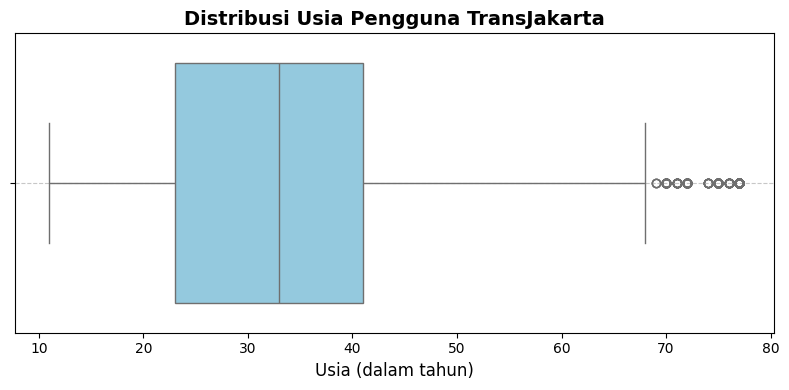

In [53]:
# Cek outlier berdasarkan usia
plt.figure(figsize=(8, 4))  # Ukuran figure biar enak dilihat
sns.boxplot(data=df, x="usia", color='skyblue')

# Tambahin judul dan label
plt.title("Distribusi Usia Pengguna TransJakarta", fontsize=14, fontweight='bold')
plt.xlabel("Usia (dalam tahun)", fontsize=12)

# Tambah grid horizontal tipis biar rapi
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

✨**Insight**
- Pengguna Transjakarta berkisar antara 10-78 Tahun.
- **Mayoritas** pengguna TransJakarta berada pada rentang usia 23–40 tahun, yang merupakan usia produktif. Hal ini mengindikasikan bahwa layanan TransJakarta banyak dimanfaatkan oleh masyarakat yang bekerja dan aktif secara mobilitas.
- **Nilai tengah (median)** pengguna adalah sekitar 33 tahun, yang menjadi representasi paling seimbang dari keseluruhan distribusi.
- Ditemukan juga outlier pada rentang usia 65–80 tahun. Meskipun tergolong ekstrem secara statistik, usia ini masih relevan secara logis, mengingat TransJakarta memiliki sejumlah fasilitas yang mendukung mobilitas lansia. Oleh karena itu, kehadiran pengguna lansia justru menjadi insight menarik terkait aksesibilitas layanan publik.

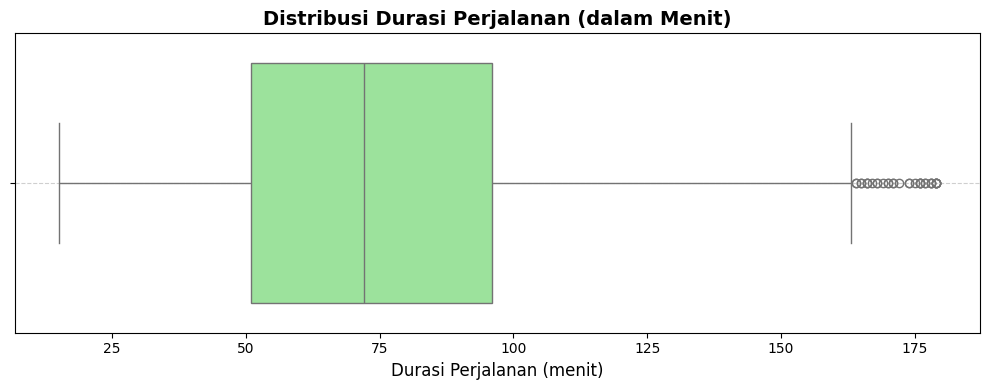

In [54]:
# Cek outlier berdasarkan usia
plt.figure(figsize=(10, 4)) 
sns.boxplot(data=df, x="TripDurationInMinutes", color='lightgreen')

# Judul dan label
plt.title("Distribusi Durasi Perjalanan (dalam Menit)", fontsize=14, fontweight='bold')
plt.xlabel("Durasi Perjalanan (menit)", fontsize=12)

# Grid horizontal tipis
plt.grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

✨**Insight**
- Secara umum Durasi perjalanan untuk satu kali trip transjakarta berkisar 50-90 menit. 
- Median dari durasi perjalanan sekitar 70 menit, yang menunjukkan bahwa sebagian besar perjalanan berlangsung dalam waktu lebih dari satu jam.
- Terdapat outlier pada rentang durasi perjalanan 160-180 menit. Meskipun tidak umum, durasi ini perlu dianalisis lebih lanjut, bisa jadi menunjukkan rute tertentu yang lebih padat, keterlambatan layanan, atau faktor lain yang relevan sebagai dasar peningkatan operasional TransJakarta.

### ✅ Kesimpulan Proses Data Cleaning

Berikut rangkuman proses pembersihan data (data cleaning) yang telah dilakukan:

- Kolom `payCardID`, `payCardBirthDate`, `tapInTime`, dan `tapOutTime` berhasil dikonversi ke tipe data yang sesuai untuk keperluan analisis waktu dan identifikasi pengguna.
  
- Masalah nilai hilang (missing value) ditangani dengan pendekatan referensial, di mana kolom `corridorID`, `corridorName`, `tapInStops`, dan `tapOutStops` diisi berdasarkan referensi dari kolom-kolom lain yang berkaitan, sehingga meminimalkan hilangnya data penting.

- Untuk kolom `payAmount`, nilai kosong diisi menggunakan modus (nilai yang paling sering muncul). Hal ini dipilih karena nilai tersebut bersifat kategorikal, bukan angka kontinu.

- Sisa missing value yang berkaitan dengan `tapOut` sengaja dibiarkan karena akan dijadikan fokus analisis dalam mengkaji perilaku gagal tap-out. Sedangkan missing value lainnya yang tersisa sangat sedikit, sehingga dianggap tidak signifikan dan dapat dihapus.

- Beberapa kolom baru ditambahkan untuk mendukung proses analisis, seperti `usia`, `TripDurationInMinutes`, `tapInHour`, `tapInDay`, dan `tapInDate`. Kolom-kolom ini diekstraksi dari informasi yang sudah ada untuk menjawab pertanyaan bisnis yang telah ditentukan di awal proyek.

- Tidak ditemukan data duplikat dalam dataset, sehingga tahap penanganan duplikasi dapat dilewati.

- Terdapat outlier pada kolom `usia` dan `TripDurationInMinutes`. Namun, karena nilai-nilai ekstrem ini memiliki potensi memberikan insight, khususnya dalam konteks lansia dan durasi perjalanan panjang, maka data tersebut tetap dipertahankan untuk dianalisis lebih lanjut.

Proses data cleaning ini memastikan bahwa dataset telah siap digunakan untuk eksplorasi lanjutan dan pengambilan insight yang bermakna.


## Data Analytics

Setelah melalui proses eksplorasi dan pembersihan data, tahap selanjutnya adalah melakukan analisis data secara menyeluruh. Pada tahap ini, fokus utama kita adalah menjawab pertanyaan-pertanyaan yang telah dirumuskan dalam bagian Tujuan Proyek.

Analisis ini bertujuan untuk:

- Menggali insight bermakna dari pola dan perilaku pengguna,
- Menyajikan informasi yang relevan dan dapat ditindaklanjuti, serta
- Memberikan dasar kuat untuk menyusun rekomendasi dan solusi atas permasalahan yang diangkat.

Untuk mendapatkan insight yang bermakna dan menjawab tujuan proyek secara komprehensif, beberapa pertanyaan kunci yang dapat digunakan sebagai panduan dalam proses analisis data antara lain:

- Apakah terdapat pola atau tren berdasarkan waktu (jam atau hari) dalam penggunaan layanan TransJakarta?
- Kapan saja jam sibuk (peak hours) terjadi, dan bagaimana karakteristik pengguna pada waktu tersebut?
- Apakah mayoritas pengguna TransJakarta merupakan komuter harian yang melakukan perjalanan dari dan ke pusat kota?
- Apakah terdapat koridor tertentu yang memiliki frekuensi tap-out tertinggi, yang dapat menjadi indikator koridor dengan volume penumpang besar?
- Apakah pengguna lansia cenderung memilih halte tertentu yang memiliki fasilitas ramah lansia, seperti lift, ramp, atau kursi tunggu?


### **Trend Waktu**
Pada tahap ini, kita akan menganalisis frekuensi perjalanan pengguna TransJakarta berdasarkan dimensi waktu, baik dari sisi jam maupun hari. Tujuannya adalah untuk mengidentifikasi pola penggunaan harian serta mengungkap jam-jam sibuk (peak hours).

Insight dari analisis ini akan menjadi dasar penting dalam menyusun rekomendasi strategis, seperti:

- Penyesuaian jadwal dan frekuensi layanan,
- Optimalisasi armada pada waktu tertentu,
- Serta peningkatan pengalaman pengguna di waktu-waktu padat.

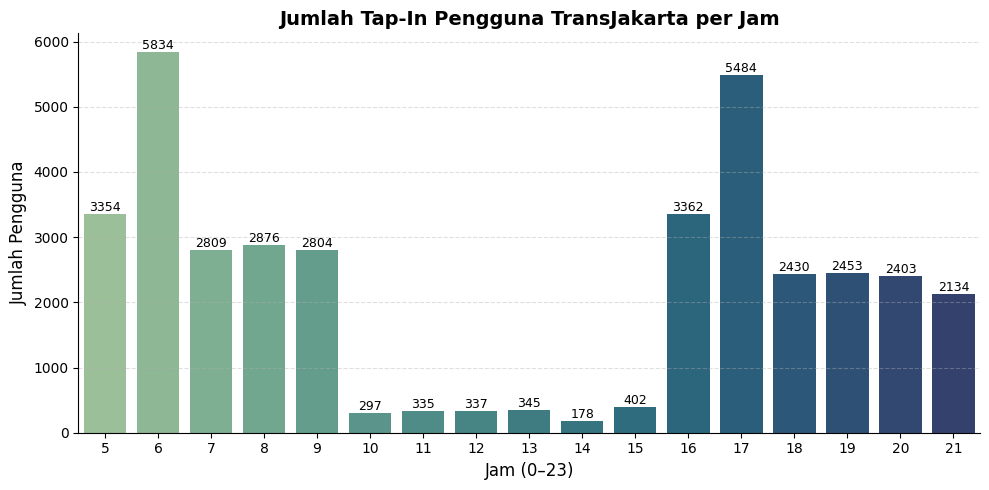

In [55]:
# membuat plot mengenai jumlah tapIn berdasarkan jam

# Membuat countplot
plt.figure(figsize=(10, 5))
ax = sns.countplot(
    data=df,
    x='tapInHour',
    palette='crest',
    order=sorted(df['tapInHour'].dropna().unique())
)

# Tambahin label jumlah di atas bar
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height)}', (p.get_x() + p.get_width()/2., height),
                ha='center', va='bottom', fontsize=9, color='black')

# Tambahin judul dan label
plt.title("Jumlah Tap-In Pengguna TransJakarta per Jam", fontsize=14, fontweight='bold')
plt.xlabel("Jam (0–23)", fontsize=12)
plt.ylabel("Jumlah Pengguna", fontsize=12)

# Bersihin garis dan tambahin grid ringan
sns.despine()
plt.grid(axis='y', linestyle='--', alpha=0.4)

plt.tight_layout()
plt.show()

Berdasarkan grafik distribusi pengguna per jam, terlihat bahwa pola perjalanan pengguna TransJakarta menunjukkan perbedaan signifikan di setiap jam operasional.  
- Pagi hari (05.00–09.00 WIB) menunjukkan volume penumpang yang tinggi, dengan puncak (peak hour) terjadi sekitar pukul 06.00 WIB.
- Setelah pukul 10.00 hingga 15.00, aktivitas cenderung menurun, menandakan periode non-sibuk.
- Sore hari (16.00–21.00 WIB) kembali menunjukkan peningkatan signifikan, dengan puncak kedua pada pukul 17.00 WIB.

Pola ini konsisten dengan perilaku komuter harian, di mana mayoritas pengguna memanfaatkan TransJakarta sebagai moda transportasi utama untuk berangkat dan pulang kerja.

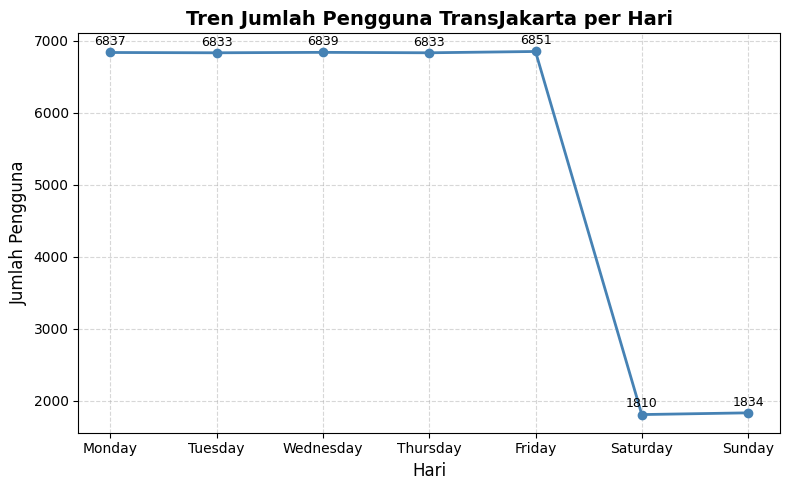

In [56]:
# Melihat perbedaan frekuensi penggunaan transjakarta berdasarkan hari
# Hitung total pengguna per hari dalam seminggu
order_hari = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
daily_trend = df['tapInDay'].value_counts().reindex(order_hari)

# Plot line chart
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(daily_trend.index, daily_trend.values, marker='o', color='steelblue', linewidth=2)

plt.title("Tren Jumlah Pengguna TransJakarta per Hari", fontsize=14, fontweight='bold')
plt.xlabel("Hari", fontsize=12)
plt.ylabel("Jumlah Pengguna", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

# Tambah label titik (optional)
for i, v in enumerate(daily_trend.values):
    plt.text(i, v + 100, str(v), ha='center', fontsize=9)

plt.tight_layout()
plt.show()


Berdasarkan hari, terdapat perbedaan yang signifkan terkait jumlah pengguna antara hari kerja (senin-jumat) dan hari libur (sabtu-minggu).
- Jumlah pengguna pada hari kerja konsisten di angka sekitar 6.830
- Jumlah pengguna pada hari libur berkisar 1.800

Temuan ini memperkuat asumsi bahwa TransJakarta merupakan moda transportasi andalan bagi para komuter untuk berangkat dan pulang kerja, terutama pada hari kerja. Pada akhir pekan, frekuensi penggunaan menurun seiring dengan berkurangnya aktivitas rutin.

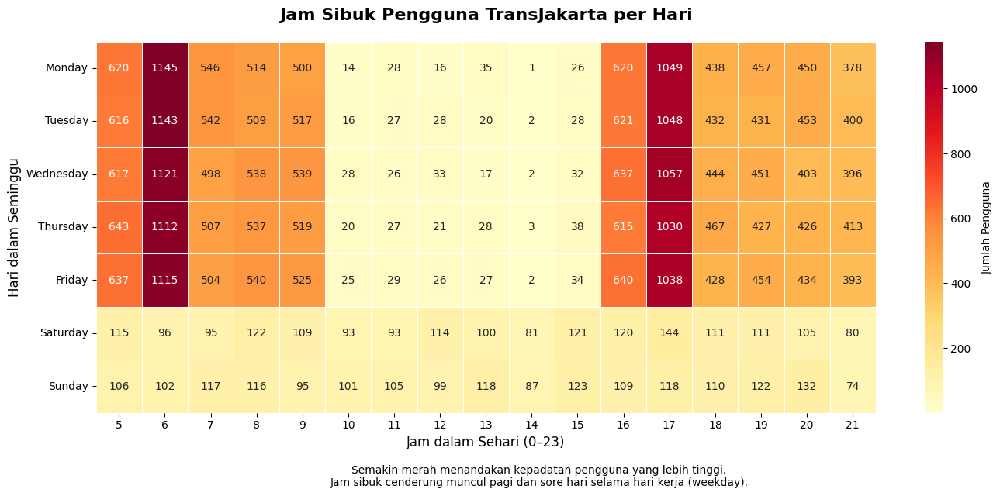

In [57]:
# Melihat jumlah pengguna berdasarkan jam dan hari
# Hitung jumlah pengguna per jam dan hari
heatmap_data = df.groupby(['tapInDay', 'tapInHour']).size().unstack()

# Urutan hari rapi
order_hari = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
heatmap_data = heatmap_data.reindex(order_hari)

# Plot
plt.figure(figsize=(14, 6))
ax = sns.heatmap(
    heatmap_data,
    cmap='YlOrRd',  # Lebih intuitif: semakin merah = semakin ramai
    linewidths=0.5,
    annot=True, fmt='.0f',  # Tampilkan angkanya langsung
    cbar_kws={'label': 'Jumlah Pengguna'}  # Label legenda
)

# Judul & label sumbu
plt.title("Jam Sibuk Pengguna TransJakarta per Hari", fontsize=16, fontweight='bold', pad=20)
plt.xlabel("Jam dalam Sehari (0–23)", fontsize=12)
plt.ylabel("Hari dalam Seminggu", fontsize=12)

# Tambah keterangan kecil di bawah
plt.figtext(0.5, -0.05,
            "Semakin merah menandakan kepadatan pengguna yang lebih tinggi.\n"
            "Jam sibuk cenderung muncul pagi dan sore hari selama hari kerja (weekday).",
            wrap=True, horizontalalignment='center', fontsize=10)

plt.tight_layout()
plt.show()

Berdasarkan data pada grafik heatmap diatas, menunjukan pola yang konsisten pada hari kerja dan hari libur.
- **Hari kerja (Senin–Jumat)** menunjukkan dua puncak kepadatan pengguna:
    - **Pagi hari:** jumlah pengguna tertinggi terjadi pada pukul 05.00–06.00 WIB, menandakan aktivitas berangkat kerja.
    - **Sore hari:** lonjakan terjadi pada pukul 16.00–17.00 WIB, saat pengguna pulang dari kantor.
    - Pola ini sedikit berbeda karena data diambil pada bulan Ramadhan, sehingga jam pulang kantor cenderung lebih awal karena pengguna ingin berbuka puasa di rumah.
- **Hari libur (Sabtu–Minggu)** menunjukkan pola penggunaan yang lebih merata di sepanjang hari, tanpa lonjakan mencolok. Ini menunjukkan bahwa perjalanan di akhir pekan bersifat lebih fleksibel dan tidak terikat jam kerja.

#### Kesimpulan
1. **Pola Penggunaan Harian**
    - Terdapat dua peak hour utama:
    - Pagi hari (05.00–09.00 WIB): Mayoritas pengguna memanfaatkan TransJakarta untuk berangkat kerja.
    - Sore hari (16.00–21.00 WIB): Lonjakan terjadi saat pulang kerja, terutama pukul 17.00 WIB.

2. **Perbedaan antara Hari Kerja dan Hari Libur**
    - Hari kerja menunjukkan volume perjalanan yang jauh lebih tinggi dibandingkan akhir pekan, dengan rerata sekitar 6.800 penumpang per hari.
    - Akhir pekan hanya menyumbang sekitar 1.800 penumpang per hari, menunjukkan penggunaan yang lebih santai dan tidak terikat waktu.

3. **Pola Spesifik Selama Ramadan**
    - Terjadi pergeseran waktu puncak sore ke pukul 16.00–17.00 WIB, menyesuaikan kebiasaan masyarakat yang ingin berbuka puasa di rumah.

#### Rekomendasi
1. **Optimalisasi Armada pada Peak Hour Hari Kerja**

    - Tambahkan armada bus pada pukul 05.00–09.00 dan 16.00–18.00 WIB untuk mengurangi kepadatan dan antrian panjang di halte.

2. **Manajemen Operasional Adaptif**

    - Selama bulan Ramadan, pertimbangkan penyesuaian jadwal operasional atau deployment armada lebih awal pada sore hari untuk mengakomodasi lonjakan penumpang yang lebih cepat.

3. **Strategi Akhir Pekan**

    - Karena penggunaan lebih rendah di hari libur, pertimbangkan pengurangan jumlah armada atau dialihkan ke rute dengan potensi permintaan rekreasi (misalnya koridor menuju tempat wisata).

4. **Peningkatan Informasi Waktu Tempuh**

    - Pasang real-time informasi di halte untuk membantu pengguna merencanakan perjalanan lebih efisien, khususnya pada jam sibuk.

5. **Kampanye Edukasi Pengguna**

    - Dorong pengguna untuk menghindari jam sibuk apabila memungkinkan, seperti pekerja fleksibel atau pelajar yang tidak terikat waktu.

### **Durasi Perjalanan**
Kita akan mengungkap pola dari layanan transjakarta, apakah ada perbedaan pada jam sibuk (peak hour). Insight ini akan digunakan sebagai rekomendasi kepada pihak terkait untuk meningkatkan layanan Transjakarta

Adapun pertanyaan untuk mendukung analisis ini yaitu:
- Apakah ada perbedaan durasi perjalanan antara peak hours dan non peak hours?
- Apakah durasi perjalanan pada pagi hari berbeda dengan sore hari?
- Apakah ada jam-jam tertentu yang secara konstan memiliki durasi perjalanan paling lama?
- Apakah koridor tertentu memiliki durasi perjalanan yang lebih panjang, terutama saat jam sibuk?
- Apakah terdapat hubungan antara kepadatan penumpang dan peningkatan durasi perjalanan?

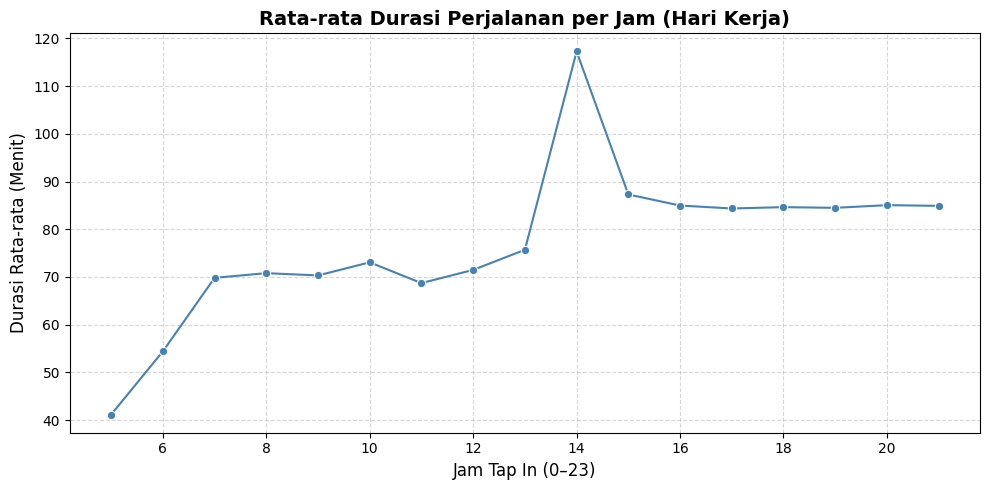

In [58]:
# Filter data untuk hari kerja (weekday)
weekday = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
df_weekday = df[df['tapInDay'].isin(weekday)]
df_weekday = df_weekday.dropna(subset=['TripDurationInMinutes'])

# Visualisasi
plt.figure(figsize=(10, 5))
sns.lineplot(
    data=df_weekday, 
    x='tapInHour', 
    y='TripDurationInMinutes', 
    estimator='mean', 
    ci=None, 
    marker='o',
    color='steelblue'
)

plt.title("Rata-rata Durasi Perjalanan per Jam (Hari Kerja)", fontsize=14, fontweight='bold')
plt.xlabel("Jam Tap In (0–23)", fontsize=12)
plt.ylabel("Durasi Rata-rata (Menit)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

- Berdasarkan grafik Rata-rata durasi perjalanan perjam pada hari kerja, menunjukan bahwa durasi perjalanan pada pagi hari (Pukul 05.00-09.00) cenderung lebih cepat dibanding sore hari.
- Jumlah pengguna tertinggi tercatat pada pukul 05.00–07.00 WIB, menunjukkan bahwa banyak penumpang sengaja memilih berangkat lebih awal untuk menghindari kemacetan dan mempercepat waktu tempuh.
- Terdapat lonjakan durasi perjalanan pada pukul 13.00–14.00 WIB, yang diduga terjadi akibat pergantian shift pengemudi TransJakarta. Proses ini berpotensi menyebabkan keterlambatan bus dan meningkatnya waktu tunggu penumpang. Oleh karena itu, diperlukan upaya efisiensi dalam manajemen shift agar keterlambatan dapat diminimalkan. 
- Pada sore hari (pukul 16.00–21.00 WIB), rata-rata durasi perjalanan mencapai sekitar 85 menit per trip, lebih lama dibanding pagi hari. Hal ini kemungkinan besar dipengaruhi oleh meningkatnya kepadatan lalu lintas saat jam pulang kerja.

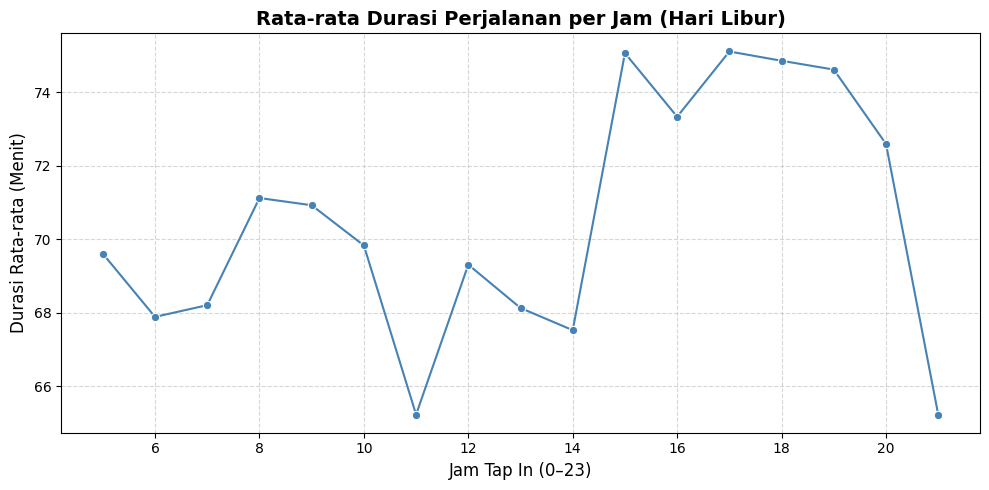

In [59]:
# Filter data untuk hari kerja (weekday)
df_weekend = df[df['tapInDay'].isin(['Saturday', 'Sunday'])]
df_weekend = df_weekend.dropna(subset=['TripDurationInMinutes'])

# Visualisasi
plt.figure(figsize=(10, 5))
sns.lineplot(
    data=df_weekend, 
    x='tapInHour', 
    y='TripDurationInMinutes', 
    estimator='mean', 
    ci=None, 
    marker='o',
    color='steelblue'
)

plt.title("Rata-rata Durasi Perjalanan per Jam (Hari Libur)", fontsize=14, fontweight='bold')
plt.xlabel("Jam Tap In (0–23)", fontsize=12)
plt.ylabel("Durasi Rata-rata (Menit)", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

- Durasi rata-rata perjalanan pada hari libur cenderung lebih stabil dibandingkan hari kerja, dengan kisaran antara 68–75 menit sepanjang hari. Hal ini menunjukkan bahwa lalu lintas dan kondisi perjalanan relatif konsisten saat akhir pekan.

- Tidak ditemukan lonjakan signifikan pada jam tertentu seperti pada hari kerja (misalnya akibat pergantian shift), yang mengindikasikan bahwa operasional TransJakarta pada hari libur berjalan lebih stabil dan tanpa gangguan besar.

- Durasi tertinggi tercatat pada pukul 15.00–18.00 WIB, yang kemungkinan disebabkan oleh peningkatan mobilitas masyarakat untuk aktivitas rekreasi, belanja, atau perjalanan keluarga menjelang malam hari.

- Menjelang malam (pukul 20.00 ke atas), durasi mulai menurun secara signifikan, seiring dengan berkurangnya volume pengguna dan kondisi lalu lintas yang lebih lengang.


**Insight Tambahan**
- Pola ini menegaskan bahwa penggunaan TransJakarta di hari libur tidak mengalami beban puncak setinggi hari kerja, dan durasi perjalanan tidak banyak dipengaruhi oleh faktor eksternal seperti kemacetan atau shift operasional.
- Efisiensi operasional bisa dianggap sudah cukup baik di akhir pekan, tetapi bisa tetap ditingkatkan untuk mengakomodasi lonjakan lokal di siang–sore hari, terutama jika ada event atau destinasi populer.

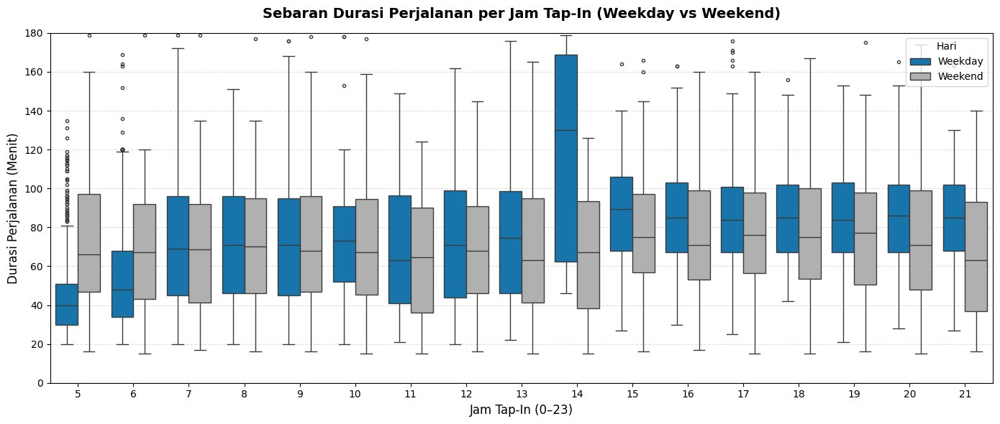

In [60]:
# Step 1: Buat kolom kategori Hari
df['KategoriHari'] = df['tapInDay'].apply(lambda x: 'Weekday' if x in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'] else 'Weekend')

# Step 2: Tentukan palet warna custom
custom_palette = {
    'Weekday': '#007cc3',  # Biru TransJakarta
    'Weekend': '#b0b0b0'   # Abu-abu
}

# Step 3: Plot boxplot
plt.figure(figsize=(14, 6))
sns.boxplot(
    data=df,
    x='tapInHour',
    y='TripDurationInMinutes',
    hue='KategoriHari',
    palette=custom_palette,
    linewidth=1,
    fliersize=3,
    whis=1.5
)

# Judul dan label
plt.title("Sebaran Durasi Perjalanan per Jam Tap-In (Weekday vs Weekend)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Jam Tap-In (0–23)", fontsize=12)
plt.ylabel("Durasi Perjalanan (Menit)", fontsize=12)

# Grid
plt.grid(axis='y', linestyle='--', alpha=0.4)

# Batas y-axis biar outlier gak ngacauin visual
plt.ylim(0, 180)

# Legenda
plt.legend(title='Hari', loc='upper right')

plt.tight_layout()
plt.show()

##### Interpretasi Grafik: Sebaran Durasi Perjalanan per Jam Tap-In (Weekday vs Weekend)
Berdasarkan grafik di atas, terlihat adanya perbedaan pola durasi perjalanan antara hari kerja (weekday) dan akhir pekan (weekend) yang cukup konsisten di hampir seluruh rentang waktu.
1. **Durasi perjalanan cenderung lebih panjang pada hari kerja.** <br>
    Ini menunjukkan bahwa mobilitas masyarakat di hari kerja sangat tinggi. Volume penumpang yang padat dan lalu lintas yang lebih sibuk diduga menjadi faktor utama mengapa perjalanan membutuhkan waktu lebih lama dibandingkan akhir pekan.

2. **Jam-jam awal operasional (sekitar pukul 05.00–06.00) menunjukkan durasi yang cukup tinggi.** <br>
    Hal ini bisa jadi disebabkan oleh keterbatasan armada yang beroperasi di awal hari. Karena belum semua bus beroperasi penuh, pengguna cenderung harus menunggu lebih lama, sehingga total durasi perjalanan ikut bertambah.

3. **Lonjakan signifikan pada pukul 13.00–14.00 pada hari kerja.** <br>
    Terlihat ada peningkatan durasi perjalanan yang cukup mencolok di jam ini. Salah satu penyebab yang masuk akal adalah pergantian shift pengemudi. Proses transisi ini berpotensi menimbulkan jeda layanan atau keterlambatan, sehingga berdampak pada waktu tempuh penumpang. </br>

4. **Hari libur menunjukkan pola yang lebih stabil dan durasi perjalanan yang relatif lebih pendek.** <br>
    Ini masuk akal, karena pada akhir pekan intensitas mobilitas masyarakat menurun. Lalu lintas cenderung lebih lancar dan kepadatan penumpang lebih rendah, sehingga perjalanan bisa berlangsung lebih efisien.



#### Rekomendasi
1. **Optimalisasi armada di jam-jam awal.** <br>
 Jika memungkinkan, menambah frekuensi bus saat pukul 05.00–07.00 dapat mengurangi waktu tunggu pengguna di pagi hari. 
 
2. **Evaluasi proses pergantian shift.** <br>
Perlu ada tinjauan ulang agar transisi antar shift tidak menyebabkan jeda layanan yang terlalu lama. Jadwal pergantian sebaiknya tidak mengganggu jam operasional utama. 

3. **Pertahankan performa akhir pekan.** <br>
Meskipun pengguna lebih sedikit, kualitas layanan perlu tetap dijaga agar pengalaman penumpang tetap optimal.

---

### **Analisis Koridor**
Dalam bagian ini, kita akan melakukan analisis terhadap penggunaan setiap koridor TransJakarta. Tujuannya adalah untuk mengetahui apakah distribusi jumlah pengguna tersebar merata di seluruh koridor, atau justru terdapat koridor-koridor tertentu yang secara signifikan lebih sering digunakan dibandingkan yang lain.

Dengan memahami seberapa ramai atau sepinya suatu koridor, kita dapat menggali berbagai insight penting, seperti:

- Efisiensi distribusi armada bus di masing-masing koridor,

- Kebutuhan peningkatan layanan atau infrastruktur di koridor-koridor padat,

- Dan potensi untuk melakukan optimalisasi rute pada koridor dengan volume penumpang yang rendah.

Melalui visualisasi ini, kita juga bisa melihat gap atau ketimpangan penggunaan antar koridor. Hal ini sangat bermanfaat sebagai dasar pengambilan keputusan strategis bagi pihak TransJakarta, khususnya dalam hal perencanaan operasional dan peningkatan pelayanan publik.

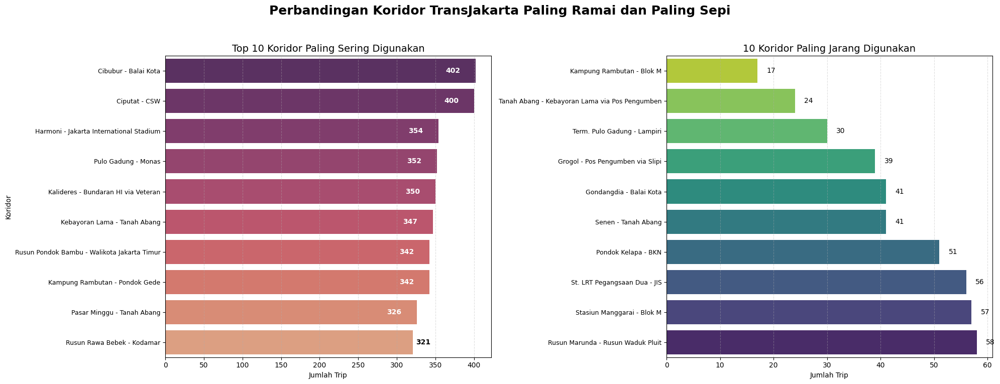

In [61]:
# Analisis Top and Least Corridor

# 1. Siapkan data (kode Anda sudah benar)
corridor_counts = df['corridorName'].value_counts()
top_10 = corridor_counts.head(10).reset_index()
top_10.columns = ['corridorName', 'jumlahTrip']
bottom_10 = corridor_counts.tail(10).reset_index()
bottom_10.columns = ['corridorName', 'jumlahTrip']
bottom_10 = bottom_10.sort_values('jumlahTrip', ascending=True)

# 2. Buat subplot
fig, axes = plt.subplots(1, 2, figsize=(20, 8)) # Sedikit penyesuaian ukuran
fig.suptitle("Perbandingan Koridor TransJakarta Paling Ramai dan Paling Sepi", fontsize=18, fontweight='bold')

# --- Plot Top 10 (Kiri) ---
sns.barplot(data=top_10, y='corridorName', x='jumlahTrip', palette='flare_r', ax=axes[0])
axes[0].set_title("Top 10 Koridor Paling Sering Digunakan", fontsize=14)
axes[0].set_xlabel("Jumlah Trip")
axes[0].set_ylabel("Koridor")
axes[0].grid(axis='x', linestyle='--', alpha=0.4)
axes[0].tick_params(axis='y', labelsize=9)

# 3. PERBAIKAN LABEL UNTUK GRAFIK TOP 10
# Tentukan batas untuk menempatkan teks di dalam atau di luar
threshold = top_10['jumlahTrip'].max() * 0.8 
for i, val in enumerate(top_10['jumlahTrip']):
    # Jika bar lebih panjang dari threshold, teks di dalam. Jika tidak, di luar.
    if val > threshold:
        x_pos = val - (top_10['jumlahTrip'].max() * 0.05) # Posisi di dalam bar
        ha = 'right'
        color = 'white'
    else:
        x_pos = val + (top_10['jumlahTrip'].max() * 0.01) # Posisi di luar bar
        ha = 'left'
        color = 'black'
    axes[0].text(x_pos, i, f"{val}", va='center', ha=ha, fontsize=10, color=color, fontweight='bold')


# --- Plot Bottom 10 (Kanan) ---
sns.barplot(data=bottom_10, y='corridorName', x='jumlahTrip', palette='viridis_r', ax=axes[1])
axes[1].set_title("10 Koridor Paling Jarang Digunakan", fontsize=14)
axes[1].set_xlabel("Jumlah Trip")
axes[1].set_ylabel(None)
axes[1].grid(axis='x', linestyle='--', alpha=0.4)
axes[1].tick_params(axis='y', labelsize=9)

# 4. PERBAIKAN LABEL UNTUK GRAFIK BOTTOM 10
# Karena semua bar pendek, kita hanya letakkan teks di luar
offset = bottom_10['jumlahTrip'].max() * 0.03
for i, val in enumerate(bottom_10['jumlahTrip']):
    axes[1].text(val + offset, i, f"{val}", va='center', ha='left', fontsize=10)


# 5. Layout akhir
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Berdasarkan data tersebut terdapat pengguna berdasarkan koridor memiliki jumlah yang berbeda secara signifikan, koridor dengan jumlah trip terbanyak yaitu **Cibubur - Balaikota** dan **Ciputat - CSW** memiliki jumlah trip sekitar 400. Sedangkan koridor tersepi yaitu **Kampung Rambutan - Blok M** memiliki jumlah trip sekitar 17. Hal ini bisa menjadi pertimbangan bagi pihak TransJakarta untuk lebih memprioritaskan koridor yang ramai untuk peningkatan layanan seperti luas halte yang lebih diperbesar agar meningkatkan kenyamanan pengguna khususnya pada jam sibuk. Kemudian penambahan armada Transjakarta pada koridor yang ramai khususnya pada jam sibuk agar bisa mengurangi waktu tunggu di halte.

Pihak Transjakarta juga harus mengevaluasi kembali koridor-koridor sepi agar koridor tersebut tidak membebani biaya operasional nantinya. Penentuan jumlah armada yang tepat sesuai dengan pola harian jumlah penumpang dapat membantu mengefisiensikan biaya operasional. Opsi lainnya adalah menggabungkan koridor sepi tersebut dengan menambah cakupan wilayah.

Analisis ini akan mengungkap lebih dalam jika dibanding dengan moda transportasi lain seperti KRL, MRT dan LRT. Sehingga rekomendasi yang tepat akan terbentuk dalam mengatasi permasalahan koridor sepi ini.

In [62]:
def waktu_singkat(jam):
    if 5 <= jam <= 9:
        return 'Pagi'
    elif 16 <= jam <= 20:
        return 'Sore'
    else:
        return 'Lainnya'

df['waktuPerjalanan'] = df['tapInHour'].apply(waktu_singkat)

Kita akan menganalisis persebarana penggun TransJakar berdasarkan jam sibuk yaitu pada pagi dan sore hari. kita akan melihat apakah persebaran cukup merata atau hanya pada diwilayah tertentu saja, seperti urban area, perkantoran dll.

In [63]:
df_pagi = df[df['waktuPerjalanan'] == 'Pagi']
df_sore = df[df['waktuPerjalanan'] == 'Sore']

In [64]:
def buat_peta_tunggal(data, nama_file, judul_peta="Heatmap TransJakarta", lokasi=[-6.1754, 106.8272], zoom=12):
    """
    Membuat satu peta yang berisi Heatmap dan Marker Cluster dari satu DataFrame.
    """
    # Inisiasi peta
    peta = folium.Map(location=lokasi, zoom_start=zoom, tiles='CartoDB positron', control_scale=True)
    
    # Ambil titik koordinat & bersihkan data kosong
    titik = data[['tapInStopsLat', 'tapInStopsLon']].dropna().values.tolist()
    
    # Tambahkan layer Heatmap
    HeatMap(titik, radius=15, blur=12).add_to(peta)
    
    # Tambahkan layer Marker Cluster
    MarkerCluster(titik).add_to(peta)
    
    # (Opsional) Tambahkan judul ke peta
    title_html = f'<h3 align="center" style="font-size:16px"><b>{judul_peta}</b></h3>'
    peta.get_root().html.add_child(folium.Element(title_html))
    
    # Simpan file peta
    peta.save(nama_file)
    print(f"Peta berhasil disimpan sebagai '{nama_file}'")
    return peta

In [65]:
# 1. Buat peta untuk data Pagi
peta_pagi = buat_peta_tunggal(
    df_pagi, 
    nama_file="peta_pagi.html", 
    judul_peta="Peta Kepadatan Pengguna TransJakarta (Pagi)"
)

# 2. Buat peta untuk data Sore
peta_sore = buat_peta_tunggal(
    df_sore, 
    nama_file="peta_sore.html", 
    judul_peta="Peta Kepadatan Pengguna TransJakarta (Sore)"
)

Peta berhasil disimpan sebagai 'peta_pagi.html'
Peta berhasil disimpan sebagai 'peta_sore.html'


In [66]:
display(peta_pagi)

Peta di atas menggambarkan distribusi spasial titik tap-in (awal perjalanan) pengguna TransJakarta pada jam-jam pagi hari. Beberapa insight penting yang dapat disimpulkan adalah:

1. **Sebaran Pengguna Meluas di Wilayah Pinggiran Jakarta** <br>
    Titik panas (hotspots) terlihat dominan di wilayah pinggiran Jakarta seperti:
    - Bekasi Barat dan Timur
    - Cibubur dan sekitarnya
    - Depok bagian utara
    - akarta Selatan bagian pinggir (Jagakarsa, Pasar Minggu)

    Ini menunjukkan bahwa banyak pengguna memulai perjalanan dari kawasan residensial/suburban menuju pusat kota.

2. **Pusat Kota Relatif Lebih Dingin (Fewer Tap-Ins)** <br>
    Area-area seperti Sudirman, Thamrin, dan Menteng cenderung memiliki intensitas tap-in yang lebih rendah di pagi hari. Hal ini mendukung hipotesis bahwa kawasan ini merupakan tujuan perjalanan, bukan titik awal.

3. **Indikasi Pola Komuter Harian** <br>
    Sebaran ini memperkuat temuan bahwa TransJakarta banyak digunakan oleh komuter yang tinggal di luar pusat kota dan melakukan perjalanan ke area perkantoran/komersial di Jakarta.

4. **Implikasi untuk Perencanaan Layanan** <br>
    Titik-titik dengan konsentrasi tinggi bisa dijadikan dasar untuk:
    - Penambahan armada atau frekuensi layanan di pagi hari
    - Optimalisasi feeder dari daerah pemukiman

In [67]:
display(peta_sore)

Peta di atas menggambarkan distribusi spasial titik tap-in (awal perjalanan) pengguna TransJakarta pada jam-jam pagi hari. Beberapa insight penting yang dapat disimpulkan adalah:

1. **Konsentrasi Tertinggi di Wilayah Pusat dan Selatan Jakarta:**
    - Titik merah paling padat tampak terpusat di daerah seperti:
        - Monas – Dukuh Atas – Thamrin – Sudirman (pusat bisnis dan perkantoran).
        - Blok M, Kuningan, dan Ragunan, yang merupakan area perkantoran, perumahan, dan transit utama.
    - Hal ini menunjukkan arus perpindahan yang tinggi dari kawasan perkantoran menuju terminal transit dan permukiman di sore hari.


2. **Koridor Padat Sore Hari:**
    - Berdasarkan intensitas titik, koridor-koridor dengan kepadatan tinggi antara lain:
        - Cibubur – Balai Kota
        - Ciputat – CSW
        - Kampung Rambutan – Monas
        - Kalideres – Harmoni

    Ini mengindikasikan bahwa jalur-jalur yang menghubungkan pusat kota dengan area suburban menjadi sangat aktif saat jam pulang kerja.


3. **Sebaran Menjangkau Area Pinggiran:**
    - Titik aktivitas pengguna juga terdeteksi di wilayah pinggiran seperti Tangerang Selatan, Bekasi Barat, dan Cibubur, meskipun dengan intensitas yang lebih rendah.
    - Ini menegaskan bahwa TransJakarta sudah menjangkau mobilitas komuter dari luar DKI Jakarta.


4. Potensi Overload di Titik Transit Utama:
    - Beberapa titik dengan intensitas sangat tinggi seperti Dukuh Atas, Harmoni, dan Pulo Gadungmenunjukkan potensi kemacetan, antrean panjang, atau risiko gagal tap out pada jam sibuk.

#### **Analisis Gagal TapOut pada pengguna Transjakarta**
Analisis ini bertujuan untuk memahami penyebab terjadinya kegagalan dalam proses tap-out pada pengguna layanan TransJakarta. Permasalahan ini dapat disebabkan oleh dua kemungkinan utama:

1. Kurangnya pemahaman pengguna terhadap prosedur yang berlaku, atau

1. Keterbatasan sistem layanan, seperti infrastruktur halte atau integrasi alat pemindai, yang belum sepenuhnya mengakomodasi kebutuhan pengguna secara optimal.

Dengan mengkaji pola kejadian gagal tap-out, baik dari sisi karakteristik pengguna maupun kondisi operasional, diharapkan dapat ditemukan akar permasalahan serta memberikan rekomendasi perbaikan yang relevan bagi peningkatan kualitas layanan TransJakarta.

In [68]:
# Filter data yang gagal tap-out
df_tapout_gagal = df[df['tapOutStops'].isna()]

# Jumlah Pengguna yang tidak tapOut
df_tapout_gagal['payCardID'].nunique()


799

In [69]:
df_tapout_gagal.shape

(1342, 29)

Berdasarkan dari data diatas dari 1.342 transaksi Transjakarta yang mengalami gagal TapOut dilakukan oleh 799 user. Hal ini menunjukan bahwa beberapa user melakukan gagal TapOut lebih dari 1 kali.

Kita akan menganalisis lebih lanjut apakah kejadian gagal TapOut ini terjadi satu kali atau berulang, kemudian kita akan mencari tau berapa banyak kejadian tersebut terulang jika user yang mengalami gagal TapOut terjadi.

In [70]:
# Ambil unique user ID dari yang gagal tap-out
user_gagal_tapout = df_tapout_gagal['payCardID'].unique()

# Filter semua transaksi dari user yang pernah gagal tap-out
df_user_gagal = df[df['payCardID'].isin(user_gagal_tapout)]

In [71]:
# Tambah kolom indikator gagal tapout
df_user_gagal['is_gagal'] = df_user_gagal['tapOutStops'].isna()

# Hitung rasio gagal tap-out tiap pengguna
rasio_per_user = df_user_gagal.groupby('payCardID')['is_gagal'].mean().reset_index()
rasio_per_user.columns = ['payCardID', 'rasio_gagal_tapout']

/var/folders/9m/2npf62r547796blh6s6fvmwr0000gn/T/ipykernel_87864/1647906118.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_user_gagal['is_gagal'] = df_user_gagal['tapOutStops'].isna()


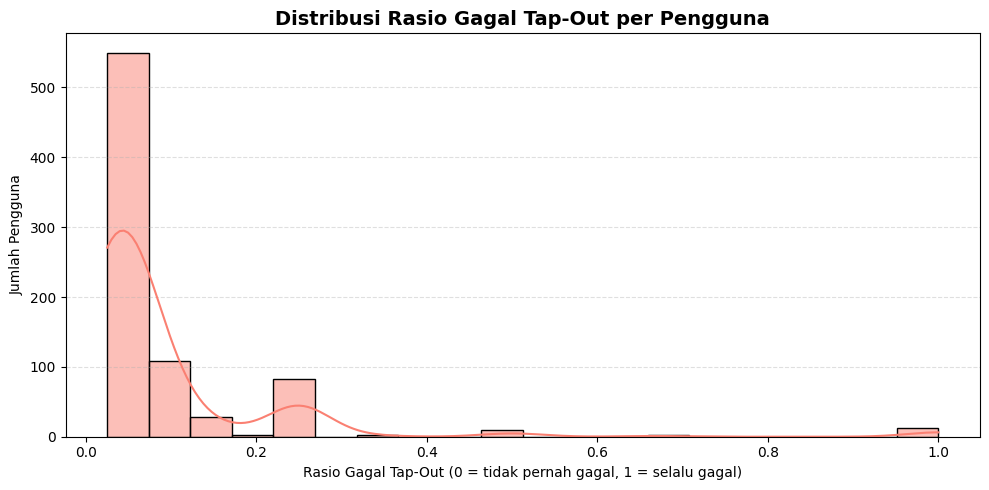

In [72]:
# Visualisasi: sebaran rasio gagal tap-out
plt.figure(figsize=(10, 5))
sns.histplot(rasio_per_user['rasio_gagal_tapout'], bins=20, kde=True, color='salmon')
plt.title("Distribusi Rasio Gagal Tap-Out per Pengguna", fontsize=14, fontweight='bold')
plt.xlabel("Rasio Gagal Tap-Out (0 = tidak pernah gagal, 1 = selalu gagal)")
plt.ylabel("Jumlah Pengguna")
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

- Grafik menunjukkan sebaran proporsi kegagalan Tap-Out pada setiap pengguna TransJakarta yang pernah mengalami kegagalan.

- Mayoritas pengguna memiliki rasio mendekati 0, yang berarti:

    - Mereka tidak selalu gagal Tap-Out, atau hanya sesekali gagal.

- Hanya sebagian kecil pengguna dengan rasio mendekati 1.0, artinya:

    - Mereka selalu gagal Tap-Out dalam semua transaksinya — kemungkinan besar tidak mengetahui prosedur Tap-Out atau abai terhadap proses tersebut.

#### Insight

- Kegagalan Tap-Out bukanlah pola tetap untuk sebagian besar pengguna.

    - Hal ini mengindikasikan bahwa kegagalan bukan karena ketidaktahuan permanen, tetapi kemungkinan besar karena faktor situasional seperti:

        - Kepadatan saat jam sibuk

        - Kurangnya waktu untuk melakukan Tap-Out

        - Atau bahkan masalah teknis yang terjadi secara acak

- Pengguna yang selalu gagal (rasio 1.0) layak mendapat perhatian khusus:

    - Mungkin mereka butuh edukasi tambahan tentang prosedur Tap-Out.

    - Bisa juga termasuk dalam kelompok rentan (misalnya lansia atau pengguna baru).

#### Analisis Gagal TapOut berdasarkan waktu
Kita memahami bahwa pada jam sibuk lebih rentan terjadinya gagal tapOut, berikut merupakan anlisis berdasarkan jam dan hari sehingga kita bisa melihat disribusi kegagalan TapOut pada jam sibuk maupun tidak.

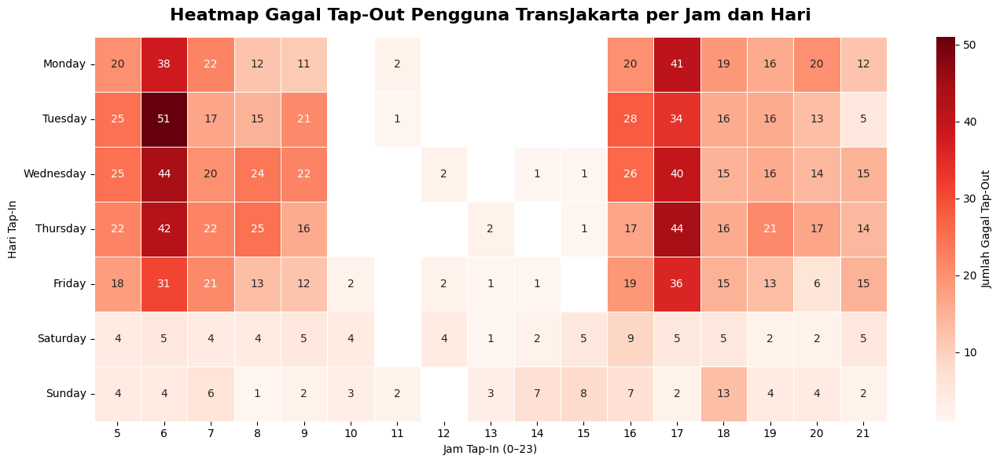

In [73]:
# Pastikan kolom tapInDay dan tapInHour sudah ada di df_tapout_gagal
# Jika belum, buat dari kolom datetime
# df_tapout_gagal['tapInDay'] = df_tapout_gagal['tapInTime'].dt.day_name()
# df_tapout_gagal['tapInHour'] = df_tapout_gagal['tapInTime'].dt.hour

# Hitung jumlah gagal tap-out berdasarkan hari dan jam
heatmap_data = df_tapout_gagal.groupby(['tapInDay', 'tapInHour']).size().unstack()

# Urutkan hari agar sesuai minggu
order_hari = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
heatmap_data = heatmap_data.reindex(order_hari)

# Plot heatmap
plt.figure(figsize=(14, 6))
sns.heatmap(
    heatmap_data,
    cmap='Reds',
    linewidths=0.5,
    annot=True,
    fmt=".0f",
    cbar_kws={'label': 'Jumlah Gagal Tap-Out'}
)

plt.title("Heatmap Gagal Tap-Out Pengguna TransJakarta per Jam dan Hari", fontsize=16, fontweight='bold', pad=15)
plt.xlabel("Jam Tap-In (0–23)")
plt.ylabel("Hari Tap-In")
plt.tight_layout()
plt.show()

Berdasarkan heatmap yang menggambarkan distribusi kegagalan Tap-Out per jam dan hari, ditemukan beberapa temuan menarik:

- **Kegagalan Tap-Out terjadi setiap hari**, baik pada hari kerja maupun akhir pekan.
- **Jumlah kegagalan Tap-Out jauh lebih tinggi pada hari kerja** (Senin–Jumat) dibandingkan hari libur (Sabtu–Minggu).
- **Pola waktu kegagalan Tap-Out pada hari kerja sangat konsisten**, di mana mayoritas kegagalan terjadi pada dua periode sibuk:
  - **Pagi hari (05.00–09.00)**, saat masyarakat berangkat kerja.
  - **Sore hari (16.00–21.00)**, saat masyarakat pulang kerja.
  
Temuan ini mengindikasikan bahwa **kepadatan penumpang selama jam sibuk** kemungkinan besar menjadi salah satu faktor yang menyebabkan kegagalan Tap-Out. Dalam situasi ramai, pengguna bisa saja tergesa-gesa, melewatkan proses Tap-Out, atau bahkan terkendala akses ke perangkat Tap-Out.

🔍 **Rekomendasi:**  
TransJakarta perlu melakukan evaluasi terhadap proses Tap-Out, terutama pada koridor dan jam yang padat. Solusi yang dapat dipertimbangkan antara lain:
- Penambahan atau optimalisasi perangkat Tap-Out di halte dengan trafik tinggi.
- Peningkatan komunikasi visual dan suara yang mengingatkan pengguna untuk melakukan Tap-Out.
- Menerapkan sistem otomatis atau notifikasi digital berbasis kartu untuk mengurangi beban manual saat turun.


Setelah menganalisis pola kegagalan Tap-Out berdasarkan waktu, langkah selanjutnya adalah menggali lebih dalam apakah terdapat koridor tertentu yang cenderung mengalami jumlah kegagalan Tap-Out yang lebih tinggi. Selain itu, kita juga akan menelusuri distribusi kegagalan Tap-Out tersebut berdasarkan hari, untuk memahami apakah terdapat pola spesifik yang muncul pada hari-hari tertentu di masing-masing koridor.

Analisis ini bertujuan untuk mengidentifikasi titik-titik rawan kegagalan Tap-Out, yang dapat digunakan sebagai dasar rekomendasi perbaikan baik dari sisi sistem maupun pelayanan TransJakarta.

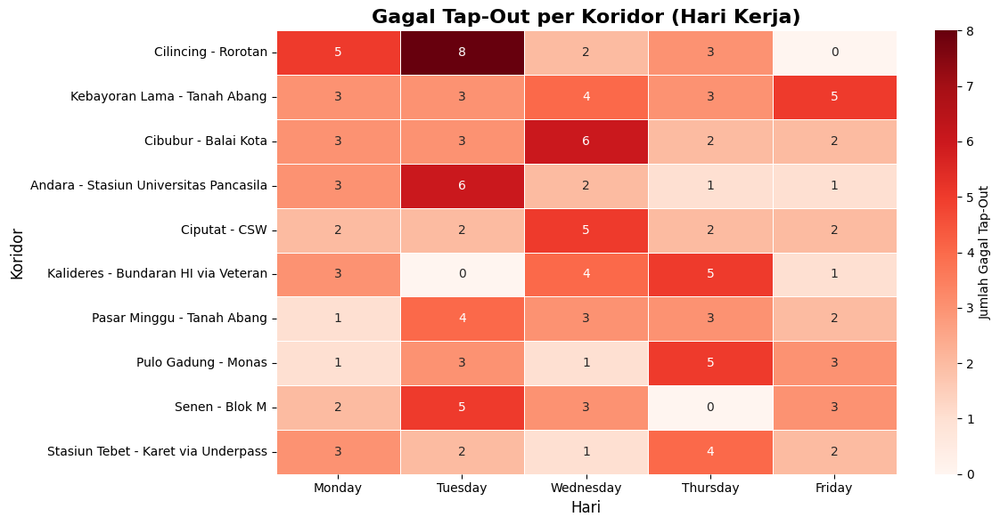

In [74]:
# Filter hanya hari kerja
hari_kerja = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
df_kerja = df_tapout_gagal[df_tapout_gagal['tapInDay'].isin(hari_kerja)]

# Hitung top 10 koridor dengan gagal terbanyak (secara total dulu)
top_koridor = df_kerja['corridorName'].value_counts().head(10).index

# Filter hanya koridor top 10
df_top_koridor = df_kerja[df_kerja['corridorName'].isin(top_koridor)]

# Buat pivot tabel (koridor vs hari kerja)
heatmap_koridor = df_top_koridor.groupby(['corridorName', 'tapInDay']).size().unstack().fillna(0)

# Urutkan hari dan koridor
order_hari = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
heatmap_koridor = heatmap_koridor[order_hari]

# Hitung total gagal Tap-Out untuk pengurutan
heatmap_koridor['Total'] = heatmap_koridor.sum(axis=1)

# Urutkan berdasarkan total dari tertinggi ke rendah
heatmap_koridor = heatmap_koridor.sort_values(by='Total', ascending=False)

# Hapus kolom 'Total' sebelum visualisasi heatmap
heatmap_koridor = heatmap_koridor.drop(columns='Total')

# Buat heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(
    heatmap_koridor,
    annot=True,
    fmt=".0f",
    cmap="Reds",
    linewidths=0.5,
    cbar_kws={'label': 'Jumlah Gagal Tap-Out'}
)

plt.title("Gagal Tap-Out per Koridor (Hari Kerja)", fontsize=16, fontweight='bold')
plt.xlabel("Hari", fontsize=12)
plt.ylabel("Koridor", fontsize=12)
plt.tight_layout()
plt.show()


Berdasarkan data heatmap, beberapa koridor menunjukkan frekuensi **kegagalan Tap-Out** yang cukup tinggi selama hari kerja. Koridor **Cilincing – Rorotan** tercatat sebagai koridor dengan kegagalan tertinggi, diikuti oleh **Kebayoran Lama – Tanah Abang** dan **Cibubur – Balai Kota**. Pola ini terjadi secara konsisten hampir setiap hari, menunjukkan bahwa permasalahan Tap-Out tidak bersifat acak, melainkan sistematis pada koridor tertentu.


####  Rekomendasi:
Untuk mengurangi kejadian gagal Tap-Out dan meningkatkan pengalaman pengguna, pihak **TransJakarta** bersama **pemerintah daerah** dapat mempertimbangkan langkah-langkah berikut:

-  **Peningkatan informasi**: Menyediakan petunjuk Tap-Out yang lebih jelas dan mudah dipahami, terutama di halte-halte dengan tingkat kegagalan tinggi.
-  **Penempatan petugas pendamping**: Menugaskan petugas pada titik-titik rawan gagal Tap-Out untuk membantu dan mengarahkan penumpang, terutama pada jam sibuk.
-  **Audit sistem Tap-Out**: Memastikan perangkat Tap-Out berfungsi optimal dan tidak menimbulkan kebingungan saat digunakan oleh penumpang.

Dengan tindakan ini, kegagalan Tap-Out diharapkan dapat ditekan, efisiensi layanan meningkat, dan kepuasan pelanggan TransJakarta makin terjaga.

Kita akan menganalisis pengguna gagal TapOut ini apakah memiliki keterkaitan dengan usia pengguna. Seperti lansia lebih rentan mengalami gagal TapOut atau tidak. Untuk mengetahui hal tersebut kita membuat grafik persebaran gagal tapOut berdasarkan Usia yang telah dikategorikan. 

/var/folders/9m/2npf62r547796blh6s6fvmwr0000gn/T/ipykernel_87864/1430856867.py:44: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Kategori Usia", loc='upper right')


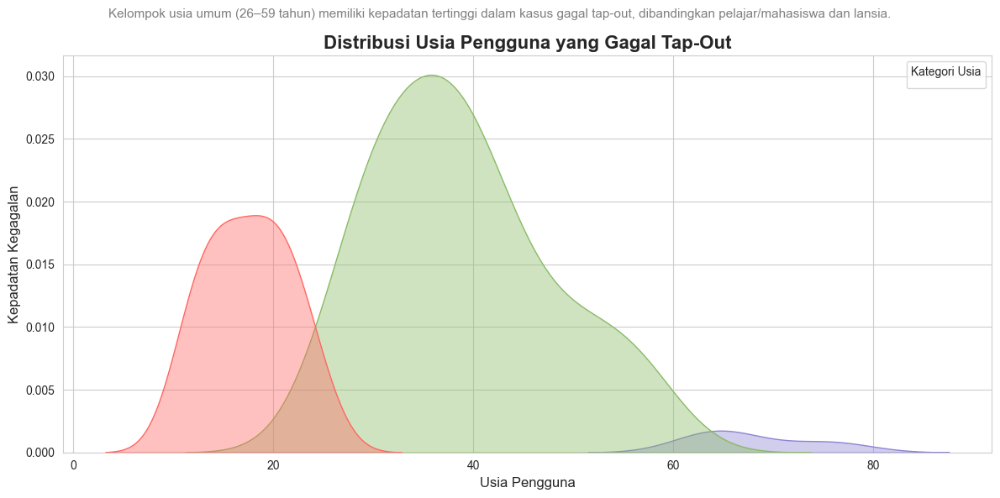

In [75]:
# Step 1: Filter usia pengguna yang gagal Tap-Out
usia_fail = df[df['tapOutStops'].isna()]['usia'].value_counts().sort_index()

# Step 2: Buat DataFrame dari value_counts
df_usia_fail = usia_fail.reset_index()
df_usia_fail.columns = ['usia', 'jumlah']

# Step 3: Tambahkan kategori usia
df_usia_fail['kategori_usia'] = df_usia_fail['usia'].apply(lambda x:
    'Pelajar/Mahasiswa' if x <= 25 else
    'Lansia' if x >= 60 else
    'Umum'
)

# Step 4: Atur style plot
sns.set_style("whitegrid")
plt.figure(figsize=(12, 6))

# Step 5: Buat KDE Plot berdasarkan kategori
sns.kdeplot(
    data=df_usia_fail,
    x='usia',
    weights='jumlah',
    hue='kategori_usia',
    fill=True,
    alpha=0.4,
    palette={
        'Pelajar/Mahasiswa': '#FF6661',
        'Umum': '#88BB64',
        'Lansia': '#8B84D4'
    }
)

# Step 6: Tambahkan judul & subtitle
plt.title("Distribusi Usia Pengguna yang Gagal Tap-Out", fontsize=16, fontweight='bold')
plt.suptitle("Kelompok usia umum (26–59 tahun) memiliki kepadatan tertinggi dalam kasus gagal tap-out, dibandingkan pelajar/mahasiswa dan lansia.",
             fontsize=11, color='gray')

# Label sumbu
plt.xlabel("Usia Pengguna", fontsize=12)
plt.ylabel("Kepadatan Kegagalan", fontsize=12)

# Legend
plt.legend(title="Kategori Usia", loc='upper right')

# Layout rapi
plt.tight_layout()
plt.show()

📘 Catatan Warna: <br>
- 🔴 Pelajar/Mahasiswa (≤ 25 tahun) diberi warna merah untuk menandai usia muda.
- 🟢 Kelompok Umum (26–59 tahun) menggunakan hijau karena merupakan mayoritas pengguna.
- 🟣 Lansia (≥ 60 tahun) diberi warna ungu sebagai penanda kelompok senior.

####  Interpretasi Distribusi Usia Pengguna yang Gagal Tap-Out

Grafik distribusi usia menunjukkan bahwa kegagalan tap-out terjadi pada berbagai kelompok usia, namun dengan karakteristik yang berbeda. Setiap kelompok memiliki tantangan tersendiri, yang dapat menjadi pertimbangan penting dalam perbaikan layanan TransJakarta.

 1. **Kelompok Pelajar/Mahasiswa (Usia ≤ 25 Tahun)** <br>
    Distribusi menunjukkan peningkatan kegagalan tap-out pada usia 18–22 tahun, dengan puncaknya di sekitar usia 20 tahun. 

    **Interpretasi**:  
        Pengguna muda kemungkinan belum terbiasa dengan prosedur tap-out atau sering bepergian dalam kelompok sehingga kurang memperhatikan proses keluar dari halte.

2. **Kelompok Umum (Usia 26–59 Tahun)** <br>
    Kelompok ini menyumbang jumlah kegagalan terbesar secara keseluruhan, dengan konsentrasi tertinggi di rentang usia 28–35 tahun.

    **Interpretasi**:  
        Meskipun sudah terbiasa menggunakan layanan TransJakarta, tekanan waktu saat jam sibuk dapat menyebabkan kelalaian dalam melakukan tap-out.

3. **Kelompok Lansia (Usia ≥ 60 Tahun)** <br>
    Terjadi peningkatan kegagalan pada usia di atas 65 tahun. Meskipun volumenya tidak sebesar kelompok umum, kepadatan cukup terlihat di sekitar usia 65–70 tahun.
    **Interpretasi**:  
        Kemungkinan disebabkan oleh kesulitan fisik, keterbatasan teknis, atau lingkungan halte yang tidak mendukung kenyamanan saat tap-out.

####  Rekomendasi Tindakan

| Kelompok            | Rekomendasi                                                                 |
|---------------------|------------------------------------------------------------------------------|
| Pelajar/Mahasiswa   | Edukasi visual/audio di halte sekitar kampus atau sekolah.                   |
| Umum (26–59 tahun)  | Tambahkan reminder visual/suara di pintu keluar halte, terutama saat jam sibuk. |
| Lansia              | Sediakan bantuan petugas di halte ramai dan buat jalur khusus tap-out.       |


Kegagalan tap-out bukan hanya masalah teknis, tapi juga perilaku dan konteks penggunaan. Oleh karena itu, pendekatan berbasis segmentasi usia dapat menjadi strategi efektif dalam meningkatkan kualitas layanan TransJakarta dan meminimalkan kesalahan tap-out di masa depan.


## Kesimpulan & Recommendasi
___

### **A. Kesimpulan**

#### Efek "Pressure Cooker" di Layanan TransJakarta

Kami menemukan narasi utama dalam analisis ini yaitu Presure Cooker. Hal ini dapat dilihat dari volume penumpang yang terkonsentrasi di koridor-koridor utama (terutama Koridor 1 dan 6) pada jam sibuk pagi dan sore menciptakan situasi layaknya panci bertekanan tinggi.

Tekanan ini memunculkan tiga bentuk nyata:
1. Efisiensi Menurun <br>
    Durasi perjalanan pada hari kerja meningkat signifikan dibandingkan akhir pekan. Artinya, semakin tinggi tekanan, semakin lambat sistem berjalan.

1. Perubahan Perilaku Pengguna <br>
    Dalam situasi padat dan terburu waktu — terutama saat jam pulang kantor — muncul fenomena kegagalan tap-out yang cukup tinggi, khususnya pada segmen pengguna usia muda.

1. Titik Stres Terpusat <br>
    Masalah ini tidak tersebar merata, tapi justru terpusat di halte dan koridor tertentu yang terus mengalami tekanan tinggi. Ini memperjelas bahwa penyebab utama bukan sistemik, tapi spasial dan terlokalisir.

Dengan kata lain, masalah TransJakarta **tidak tersebar**, melainkan **terprediksi dan terkonsentrasi**. <br>
Ini merupakan **keuntungan strategis**: sumber daya untuk perbaikan bisa difokuskan pada titik tekanan tertinggiuntuk dampak maksimal.


<br>

#### **B. Ringkasan**

Analisis ini dilakukan untuk memahami perilaku dan pola perjalanan pengguna TransJakarta berdasarkan data historis tap-in dan tap-out. Tujuannya adalah untuk mendukung peningkatan layanan publik yang lebih efisien, adil, dan berbasis data. <br>
Berikut adalah ringkasan temuan utama dari seluruh bagian analisis:

1. **Analisis Tren Waktu** <br>
    - **Jam Sibuk:** Aktivitas penumpang memuncak dua kali sehari, yaitu pagi (07.00–08.00) dan sore (17.00–18.00), sejalan dengan jadwal kerja dan sekolah.
    - **Hari vs Jam:** Hari kerja menunjukkan volume perjalanan lebih tinggi dibanding akhir pekan. Hari libur memiliki distribusi perjalanan yang lebih merata dan tidak terlalu padat.
    - **Durasi Perjalanan:** Durasi cenderung lebih singkat pada akhir pekan dibanding hari kerja. Hal ini menunjukkan potensi pengaruh kondisi lalu lintas terhadap efisiensi perjalanan.

2. **Persebaran Rute & Koridor** <br>
    - **Koridor Terpadat:** Koridor 1 dan 6 adalah jalur yang paling sering digunakan, dengan halte-halte utama seperti Blok M, Harmoni, Dukuh Atas, dan Pulo Gadung.
    - **Rute Favorit:** Beberapa rute menunjukkan dominasi jumlah penumpang yang tinggi secara konsisten, menandakan pentingnya rute tersebut dalam mobilitas kota.
    - **Penyebaran Tap-In dan Tap-Out:** Titik tap-in lebih terdistribusi di wilayah pinggiran, sedangkan tap-out banyak terjadi di pusat kota — menunjukkan pola komuter dari pinggiran ke pusat.


3. **Kegagalan Tap-Out** <br>
    - **Waktu Gagal:** Kegagalan tap-out paling sering terjadi pada jam sibuk, terutama sore hari. Hal ini menunjukkan bahwa tekanan waktu saat turun dari bus berkontribusi pada kelalaian.
    - **Koridor Rawan Gagal Tap-Out:** Koridor 1 dan 6 juga mencatat tingkat gagal tap-out tinggi, berbanding lurus dengan volume penumpang yang besar.
    - **Usia Pengguna:** Pengguna usia muda (17–25 tahun) adalah kelompok terbesar yang mengalami gagal tap-out, disusul oleh kelompok dewasa (26–35 tahun). Kelompok lansia juga memiliki kegagalan, meskipun volumenya lebih kecil.



<p>Durasi perjalanan yang lama dan kepadatan di jam sibuk adalah "pain point" utama pelanggan. Kegagalan tap-out, meskipun sering dianggap kesalahan pengguna, juga dapat dilihat sebagai cerminan dari desain layanan (alur di halte, kepadatan bus) yang belum optimal. Peningkatan pada area ini secara langsung akan meningkatkan skor kepuasan dan loyalitas pelanggan.</p>


### **Kesimpulan dari Sisi Bisnis**
Kesimpulan bisnis ini penting, meskipun Transjakarta adalah layanan transportasi umum yang dimiliki dan dikelola oleh pemerintah, tetapi untuk menjaga keberlangsungan dan peningkatan layanan maka perlu disampaikan juga.

1. **Kebocoran Data & Potensi Kehilangan Pendapatan** <br>
    Setiap kali pengguna gagal melakukan tap-out, bukan hanya aturan yang dilanggar — tapi juga terjadi kehilangan data penting.
    Data ini sangat krusial karena menunjukkan dari mana dan ke mana penumpang bergerak (Origin–Destination/OD).
    Tanpa data OD yang akurat, perencanaan rute masa depan akan jauh lebih sulit, dan TransJakarta juga akan kesulitan jika ingin menerapkan sistem tarif berbasis jarak.

    Artinya: Kegagalan tapOut = hilangnya potensi perbaikan layanan dan pendapatan.

2. **Biaya Inefisiensi Operasional**  <br>
    Armada TransJakarta yang tetap beroperasi di rute dan jam yang sepi berarti ada biaya yang tidak efisien.
    Jika kendaraan bisa direalokasikan ke rute dan waktu yang lebih sibuk, maka efisiensinya akan meningkat dan biaya bisa ditekan.

    Dengan menghitung potensi penghematan ini, kita bisa mendapatkan indikator bisnis yang nyata untuk mendukung pengambilan keputusan.

3. **Pengalaman Pelanggan (_Customer Experience_) Sebagai Fokus Utama** <br>
    Durasi perjalanan yang panjang dan kepadatan tinggi di jam sibuk adalah keluhan utama pengguna.
    Meskipun kegagalan tapOut sering dianggap sebagai kesalahan pengguna, sebenarnya hal ini bisa mencerminkan adanya desain layanan yang belum optimal, seperti:

    - alur keluar halte yang sempit, 
    - bus yang terlalu penuh, atau 
    - waktu tunggu yang mepet.


Dengan memperbaiki titik-titik ini, kepuasan dan loyalitas pelanggan akan meningkat dan ini bisa menjadi metrik penting dalam transformasi layanan publik.

---

### **Rekomendasi Strategis**

Untuk memastikan setiap rekomendasi dapat diterapkan secara efektif, kami membaginya ke dalam tiga horizon waktu: Jangka Pendek untuk mengatasi masalah mendesak, Jangka Menengah untuk membangun fondasi, dan Jangka Panjang untuk inovasi transformatif.

#### **Jangka Pendek (Implementasi < 6 Bulan)**

**Fokus: Mengurangi "Pain Points" Harian & Meraih Kemenangan Cepat (Quick Wins)**

Ini adalah langkah-langkah berbiaya relatif rendah dengan dampak tinggi yang bisa langsung dirasakan oleh penumpang.

1.  **Optimalisasi Layanan Subuh (Pukul 05.00):**
    
    *   **Masalah:** Analisis menunjukkan sudah ada permintaan signifikan pada pukul 05.00, namun keluhan di lapangan menyebutkan sulitnya mendapatkan bus tepat waktu.
        
    *   **Rekomendasi:** Lakukan **penjadwalan ulang khusus untuk keberangkatan pertama** di koridor-koridor utama (1, 6, dll.). Pastikan armada pertama sudah siap beroperasi _sebelum_ pukul 05.00 untuk mengantisipasi lonjakan awal. Ini adalah prioritas utama untuk meningkatkan kepuasan komuter pagi.
        
2.  **Kampanye Edukasi & Pengingat Intensif:**
    
    *   **Masalah:** Tingginya angka gagal tap-out pada jam sibuk dan pada kelompok usia muda.
        
    *   **Rekomendasi:**
        
        *   Pasang **pengingat visual (stiker/poster) dan audio** di semua pintu keluar bus dan halte-halte terpadat.
            
        *   Luncurkan **kampanye edukasi di media sosial (TikTok/Instagram)** yang menargetkan demografi pelajar/mahasiswa, menjelaskan pentingnya tap-out.
            
3.  **Penempatan Petugas Bantu di Titik Kritis:**
    
    *   **Masalah:** Kelompok lansia dan kepadatan di jam sibuk menyulitkan proses tap-out.
        
    *   **Rekomendasi:** Tempatkan "Petugas Siaga" di halte-halte paling padat pada jam sibuk sore untuk secara proaktif membantu penumpang lansia dan mengingatkan penumpang lain untuk tap-out.
        
<br>

#### **Jangka Menengah (Implementasi 6 - 18 Bulan)**

**Fokus: Membangun Fondasi Sistem & Kapasitas**

Ini adalah proyek yang memerlukan investasi dan perencanaan lebih, tetapi akan menjadi tulang punggung untuk operasi yang lebih cerdas di masa depan.

1.  **Pembangunan Dashboard Monitoring Real-Time:**
    
    *   **Rekomendasi:** Kembangkan dan implementasikan dashboard internal untuk tim operasional guna memantau kepadatan koridor, headway bus, dan anomali gagal tap-out secara langsung.
        
2.  **Evaluasi dan Rasionalisasi Rute:**
    
    *   **Rekomendasi:** Lakukan studi mendalam terhadap koridor-koridor dengan volume sangat rendah. Analisis penyebabnya (misalnya, tumpang tindih dengan moda lain) dan putuskan apakah rute tersebut perlu **digabung, diubah, atau armadanya dikurangi** untuk efisiensi biaya.
        
3.  **Uji Coba (Pilot Project) Notifikasi Digital:**
    
    *   **Rekomendasi:** Kembangkan prototipe fitur **notifikasi via aplikasi JakLingko** yang mengingatkan pengguna jika mereka terdeteksi belum melakukan tap-out setelah beberapa waktu. Uji coba di satu atau dua koridor terlebih dahulu untuk mengukur efektivitas dan respons pengguna.
        
<br>

#### **Jangka Panjang (Implementasi > 18 Bulan)**

**Fokus: Transformasi Model Bisnis & Inovasi Layanan**

Ini adalah inisiatif visioner yang akan mengubah cara TransJakarta beroperasi dan berinteraksi dengan penggunanya.

1.  **Studi Kelayakan Skema Tarif Dinamis (Dynamic Pricing):**
    
    *   **Masalah:** Kepadatan ekstrem pada jam sibuk yang sulit diatasi hanya dengan menambah armada.
        
    *   **Rekomendasi:** Lakukan studi kelayakan mendalam untuk **skema tarif dinamis**.
        
        *   **Konsep:** Tawarkan **tarif lebih murah (misalnya, diskon 30-50%) bagi penumpang yang melakukan perjalanan di luar jam puncak (off-peak hours)**, seperti pukul 09.00-11.00.
            
        *   **Tujuan:** Memberikan insentif bagi penumpang yang jadwalnya fleksibel (misalnya, mahasiswa, pekerja lepas) untuk menggeser waktu perjalanannya, sehingga secara proaktif **"meratakan kurva" kepadatan** tanpa harus menambah biaya operasional secara masif.
            
        *   **Analisis:** Studi ini harus mencakup analisis dampak terhadap pendapatan, potensi perubahan perilaku penumpang, dan kesiapan teknis sistem tiket.
            
2.  **Pengembangan Fitur Tap-Out Pasif/Otomatis:**
    
    *   **Rekomendasi:** Investasikan dalam riset dan pengembangan (R&D) untuk teknologi tap-out otomatis menggunakan **Bluetooth (BLE) atau Geofencing** di halte-halte utama. Ini adalah solusi ultimate untuk menghilangkan masalah gagal tap-out.
        
3.  **Integrasi Data Antarmoda Penuh:**
    
    *   **Rekomendasi:** Bangun platform yang mengintegrasikan data perjalanan TransJakarta dengan MRT, LRT, dan KRL untuk memetakan **perjalanan** _**end-to-end**_ penumpang. Ini akan membuka level baru dalam perencanaan rute dan layanan terintegrasi.



### Analisis Lanjutan
- Lakukan **model prediktif** untuk memproyeksikan beban penumpang di masa depan.
- Gunakan teknik machine learning untuk mendeteksi potensi penyalahgunaan kartu (tap-in tanpa tap-out yang berulang).
- Telusuri dampak kebijakan baru (seperti tarif flat atau integrasi MRT/LRT) terhadap pola perjalanan.


### Penutup

Analisis ini adalah langkah awal untuk mengubah paradigma operasional TransJakarta dari reaktif (menanggapi keluhan) menjadi proaktif (mengatasi masalah sebelum membesar), dan pada akhirnya menjadi prediktif (mengantisipasi kebutuhan di masa depan).  Dengan memfokuskan 

sumber daya pada "titik-titik tekanan" yang telah teridentifikasi dan menerapkan solusi yang terprioritaskan, TransJakarta tidak hanya akan meningkatkan efisiensi layanan, tetapi juga membangun fondasi sistem transportasi publik cerdas yang siap menghadapi tantangan 

kota metropolitan di masa depan.